# <CENTER><div class="alert alert-block alert-info"><b>Analyse des données 'Open Food Facts' en vue de la conception d'une application au service de la santé publique <br> Nettoyage du jeu de données</b><div><CENTER>   
    

### Problématique:
Créer une application en lien avec l'alimentation

### Source du jeu de données:
https://world.openfoodfacts.org/data du site Open Food Facts 

### Objectifs:
1. Traiter le jeu de données en réfléchissant à une idée d'application
2. Nettoyer le jeu de données en comblant les valeurs manquantes notamment pour le nutri-score
    
    
    
La note Nutri-Score est déterminée par la quantité de nutriments bons et mauvais pour la santé :

Points négatifs : l'énergie, les graisses saturées, les sucres, et le sodium (des niveaux élevés sont considérés comme mauvais pour la santé)

Points positifs : la proportion de fruits, de légumes, de noix, d'huiles d'olive, de colza et de noix, de fibres et de protéines (les niveaux élevés sont considérés comme bons pour la santé).

La formule détaillée du Nutri-Score est disponible publiquement sur le site Web de Santé publique France.


### <a name="C0">Sommaire</a>

- <a href="#C1">1. Importation des librairies nécessaires et réglage des propriétés communes des figures</a>
- <a href="#C2">2. Description du jeu de données</a>
    - <a href="#C21">2.1. Description générale</a>
    - <a href="#C22">2.2. Description des variables concernant les catégories</a>
- <a href="#C3">3. Nettoyage du jeu de données</a>
    - <a href="#C31">3.1. Filtrage des produits par la localisation</a></div>
    - <a href="#C32">3.2. Suppression des variables avec un taux de remplissage faible</a>
    - <a href="#C33">3.3. Vérification de la qualité de l'identification des produits</a>
    - <a href="#C34">3.4. Valeurs aberrantes</a></div>
        - <a href="#C341">3.4.1. Valeurs nutritionnelles supérieures à 100g ou négatives</a>
        - <a href="#C342">3.4.2. Somme des nutriments supérieure à 100g</a>
        - <a href="#C343">3.4.3. Valeurs énergétiques supérieures à 3700 kJ</a>
        - <a href="#C344">3.4.4. Quantité de sucres supérieure à la quantité de glucides</a>
        - <a href="#C345">3.4.5. Cohérence entre nutrition_grade et nutrition-score</a>
    - <a href="#C35">3.5. Traitements des valeurs manquantes</a>
        - <a href="#C351">3.5.1. Suppression des produits sans aucune information nutritionnelle</a>
        - <a href="#C352">3.5.2. Valeurs manquantes pour les valeurs nutritives</a>
            - <a href="#C3521">3.5.2.1. Valeurs manquantes pour les glucides</a>
            - <a href="#C3522">3.5.2.2. Valeurs manquantes pour les lipides</a>
            - <a href="#C3523">3.5.2.3. Valeurs manquantes pour les proteines</a>
            - <a href="#C3524">3.5.2.4. Valeurs manquantes pour les autres nutriments</a>
        - <a href="#C353">3.5.3. Valeurs manquantes pour l'énergie</a>
- <a href="#C4">4. Valeurs manquantes pour le Nutri-score</a>
    - <a href="#C41">4.1. Quels sont les valeurs manquantes?</a>
    - <a href="#C42">4.2. Le nutri-score est-il corrélé avec d'autres variables?</a>
    - <a href="#C43">4.3. Estimation de la note du nutri-score: modèles de classification</a>
        - <a href="#C431">4.3.1. Préparation et séléction du jeu de données</a>
        - <a href="#C432">4.3.2. Classifieur k-NN</a>
        - <a href="#C433">4.3.3. Classifieur Random Forest</a>
        - <a href="#C434">4.3.4. Séléction du modèle</a>
        - <a href="#C435">4.3.5. Prédiction des valeurs manquantes</a>
- <a href="#C5">5. Sauvegarde du nouveau jeu de données</a>

# <div class="alert alert-block alert-info"><a name="C1">1. Importation des librairies nécessaires et réglage des propriétés communes des figures</a></div>
Pour l'analyse de ce jeu de données, nous aurons besoin des librairies : Pandas, Matplotlib, Seaborn. La librairie sci-kit learn est également utilisée. Les packages nécessaires sont importés au moment de leur utilisation.

In [1]:
# Importation des librairies nécessaires

import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
import numpy as np
%matplotlib inline

In [2]:
# Propriétés communes des figures pour avoir un rendu harmonieux
sns.set()
sns.set_theme(style="white", context="notebook")
plt.rcParams['figure.dpi'] = 150
plt.rc('font', size=12)         #taille de la police de l'échelle des axes
plt.rc('axes',titlesize=18)     #taille de la police du titre
plt.rc('axes',labelsize=16)     #taille de la police du titre des axes
plt.rc('xtick', labelsize=12)   #taille de la police de l'échelle de l'axe x
plt.rc('ytick', labelsize=12)   #taille de la police de l'échelle de l'axe y
plt.rc('legend', fontsize=12) # taille de la légende
plt.rc('figure', titlesize=18) # taille du titre

<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>


# <div class="alert alert-block alert-info"><a name="C2">2. Description du jeu de données</a></div>

## <div class="alert alert-block alert-info"><a name="C21">2.1. Description générale</a></div>

In [3]:
# Lire le fichier csv et afficher les 5 premières du jeu de données
data = pd.read_csv('fr.openfoodfacts.org.products.csv',sep ='\t', low_memory = False)
data.head()

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,NaN,1kg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0000000004530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,14.0,14.0,NaN,NaN
2,0000000004559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN
3,0000000016087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,12.0,NaN,NaN
4,0000000016094,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055653,2017-03-09T10:34:13Z,1489055653,2017-03-09T10:34:13Z,Organic Polenta,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
# Connaitre la taille du jeu de données
print("Le jeu de données data se compose de", data.shape[0], "lignes et de", data.shape[1], "colonnes")

Le jeu de données data se compose de 320772 lignes et de 162 colonnes


In [5]:
# Connaitre le nombre de valeurs manquantes par variable
data.isnull().sum()

code                           23
url                            23
creator                         2
created_t                       3
created_datetime                9
                            ...  
carbon-footprint_100g      320504
nutrition-score-fr_100g     99562
nutrition-score-uk_100g     99562
glycemic-index_100g        320772
water-hardness_100g        320772
Length: 162, dtype: int64

Ce jeu de données contient des informations sur des produits alimentaires. Chaque ligne correspond à un produit.

Avec la commande précédente, il apparait que les deux dernières variables du jeu de données sont totalement vides.
Est-ce le cas pour d'autres variables?

Pour répondre à cette question, j'ai choisi d'utiliser la boîte à outils missingo (https://github.com/ResidentMario/missingno) qui permet d'avoir un rapide aperçu du taux de remplissage du jeu de données.

<AxesSubplot:>

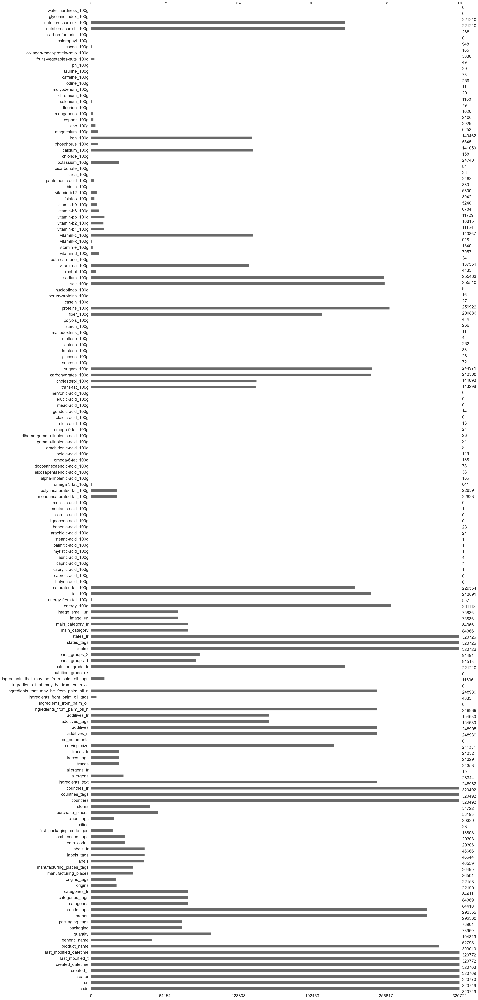

In [6]:
import missingno as msno

#Pour afficher un histogramme représentant le taux de remplissage
msno.bar(data)

#plt.savefig('fig manquante.png', dpi=300)

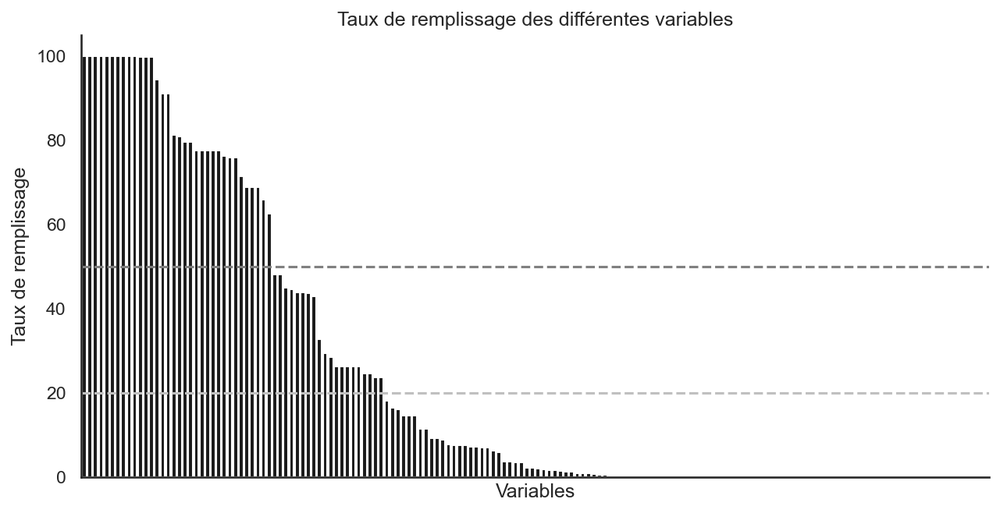

In [7]:
# Autre façon de représenter le taux de remplissage du jeu de données

pourcentage_valeurs_manquantes = data.notnull().sum() / len(data)*100
pourcentage_valeurs_manquantes = pourcentage_valeurs_manquantes.sort_values(ascending=False)
noms_variable = pourcentage_valeurs_manquantes.index
valeurs = pourcentage_valeurs_manquantes.values

plt.figure(figsize =(10,5))
sns.set_theme(style="white", context="notebook")
ax = plt.axes()
ax = sns.barplot(x=noms_variable,y=valeurs, color='k' )
plt.title("Taux de remplissage des différentes variables")
plt.ylabel("Taux de remplissage")

plt.axhline(y=50, color='grey', linestyle='--')
plt.axhline(y=20, color='silver', linestyle='--')
ax.axes.xaxis.set_ticks([])
ax.set_xlabel("Variables")
sns.despine()
plt.show()

Cette représentation permet de voir que certaines colonnes sont complétement remplies (colonnes qui apparaissent noires) alors que d'autre sont complétement vides (colonnes qui apparaissent blanches) ou peu renseignées. 

Un nettoyage du jeu de données en fonction du taux de remplissage sera réalisé dans une prochaine section.

<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

## <div class="alert alert-block alert-info"><a name="C22">2.2. Description des variables concernant les catégories</a></div>

Les produits du jeu de données peuvent être classés par catégories. Plusieurs variables définissent des catégories:
- categories
- categories_tag
- categories_fr
- main-category
- main-category_fr
- pnns_groups_1
- pnns_groups_2

A quoi correspondent ces différentes variables? Quel est leur taux de remplissage? 

### <div class="alert alert-block alert-info"><a name="C221">2.2.1. La variable 'categories'</a></div>

In [8]:
print("Le nombre de catégories pour 'categories' est", len(data['categories'].unique()))
print("Le taux de remplissage de 'categories' est de", (data["categories"].notnull().sum()*100/data.shape[0]))
print("Les différentes catégories sont:")
for category in data['categories'].unique():
    print(category)

Le nombre de catégories pour 'categories' est 36983
Le taux de remplissage de 'categories' est de 26.314640928759367
Les différentes catégories sont:
nan
Filet de bœuf
Légumes-feuilles
Snacks sucrés,Biscuits et gâteaux,Pâtisseries
Plant-based foods and beverages,Plant-based foods,Cereals and potatoes,Breads
Boulange
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Légumineuses et dérivés,Céréales et pommes de terre,Légumineuses,Graines,Graines de légumineuses,Légumes secs,Lentilles vertes
Root bier
Snacks sucrés,Biscuits et gâteaux,Biscuits,Sablés
Quiches lorraines
Poulets cuisinés
Bonbons
Aliments et boissons à base de végétaux,Boissons,Aliments d'origine végétale,Boissons chaudes,Infusions,Thés,Thés noirs,Boissons non sucrées,Thés noirs aromatisés,Thés aromatisés
Sirops,Sirops pour ganache
Chicken feet
Pralinen
Desserts,Christmas Puddings,Puddings
Sugary snacks,Desserts,Biscuits and cakes,Cakes,Christmas Puddings,Puddings
Sodas au cola
Plant-based foods and beverag

Meats,Pork,Salami
Filets de maquereaux,Maquereaux en conserve
Crème Fraîche,Cream
Seafood,Fishes,Tunas
Céréales en grains,Mélanges de céréales
Chips de maïs
Plant-based foods and beverages,Plant-based foods,Fruits and vegetables based foods,Fruits based foods,Fruits,Apples,Fresh Fruits
Mozzarellas
Hazelnut chocolate spread
squash,drinks
Black seedless grapes
Tomato & basil sauce,Tomato sauce
garlic and coriander naan
Beverages,Carbonated drinks,Sodas,Colas,Sugared beverages
Fischkonserve
Unsalted Butter,Butter
Sweetcorn
Blueberry muffins,Muffins
Laits
Plant-based foods and beverages,Plant-based foods,Fresh foods,Fresh plant-based foods,Mushrooms and their products,Mushrooms
Back bacon
Fruit sauces
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Frais,Produits à tartiner,Pâtes à tartiner végétaux,Matières grasses,Matières grasses végétales,Produits à tartiner salés,Margarines,Margarines à faible teneur en matières grasses
fr:boisson gazeuse
Meats,Poultries,Turkeys,Tu

Paupiettes de porc
Viandes,Charcuteries,Saucissons,Saucisses sèches
Produits laitiers,Laits,Laits demi-écrémés
Matières grasses végétales,Huiles de Coprah
Biscuits à la fraise
Snacks sucrés,Chocolats,Chocolats noirs,Chocolats noirs extra fin,tablette chocolat,cacao
Snacks sucrés,Desserts,Biscuits et gâteaux,Gâteaux,Barres pâtissières
Pain au chocolat
fr:Semoules de blé dur pour couscous
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Aliments à base de fruits et de légumes,Desserts,Fruits et produits dérivés,Compotes,Compotes de pomme,Compotes pommes nature
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Aliments à base de fruits et de légumes,Desserts,Fruits et produits dérivés,Compotes,Compotes pommes banane,Compotes allégées
Boissons,Eaux,Boissons non sucrées,Eaux de sources
Boissons,Boissons gazeuses,Eaux,Eaux minérales,Eaux gazeuses,Eaux minérales naturelles,Eaux minérales gazeuses,Boissons non sucrées
Beverages,Carbonated drinks,Sodas,fr:So

Foies gras de canard
Produits de la mer,Crustacés,Tourteaux
Poissons et viandes et oeufs,Foies gras,Bloc de foie gras,Bloc de foie gras avec morceaux,Foies gras de canard
Sauces,Sauces aux champignons
Jambons Label Rouge
Tartiflettes,Plats préparés en conserve
Produits à tartiner,Produits laitiers,Matières grasses,Spreadable fats,Matières grasses animales,Milkfat,Beurres,Beurres moulés,Beurres doux,Beurres pasteurisés
Plats préparés,Plats à base de viande,Plats préparés frais,Plats préparés à réchauffer au micro-ondes
Viandes,Porc,Poitrine de porc
Cafés torréfiés,Cafés moulus
Pâtes à pizza,Pâte à Pizza Bio
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Frais,Aliments à base de fruits et de légumes,Aliments à base de plantes frais,Légumes et dérivés,Légumes frais,Betteraves
Soupes de légumes
Cookies au chocolat et aux noisettes
en:plant-based-foods-and-beverages, en:plant-based-beverages, en:fruit-based-beverages, en:juices-and-nectars, en:fruit-juices-and-nectars, 

Snacks sucrés,Biscuits et gâteaux,Biscuits,Biscuits au chocolat noir
Petit-déjeuners
Biscuits apéritifs,Biscuits salés
Snacks sucrés,Biscuits et gâteaux,Biscuits,Biscuits au chocolat,fr:Biscuits au chocolat au lait
Snacks sucrés,Biscuits et gâteaux,Biscuits,Gaufres,Gaufrettes,Gaufrettes fourrées,Gaufres fourrées,Gaufrettes fourrées à la vanille
biscuits au chocolat
Gâteau apéritif
Apéritif,Crackers
en:plant-based-foods-and-beverages, en:plant-based-foods, en:cereals-and-potatoes, en:breads, en:zwieback
Snacks sucrés,Desserts,Biscuits et gâteaux,Biscuits,Cookies,Cookies au chocolat,Biscuits au chocolat
Cookies aux amandes,Biscuits,Cookies,Cookies au chocolat
Barres,Barres de céréales,Biscuits,Petit-déjeuners
Snacks sucrés,Desserts,Biscuits et gâteaux,Biscuits,Gâteaux
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Snacks sucrés,Pains,Viennoiseries,Pains au lait,Pains grillés,Pains au lait aux pépites de chocolat
Aliments et boissons à base

Aliments et boissons à base de végétaux,Aliments d'origine végétale,Frais,Aliments à base de fruits et de légumes,Aliments à base de plantes frais,Légumes et dérivés,Légumes frais,Snacks salés,Apéritif,Produits déshydratés,Aliments à base de plantes séchés,Légumes séchées,Tomates et dérivés,Tomates séchées,Tomates,Tomates cerise,Tomates séchées à l'huile
Gratins
Spreads,Breakfasts,Sweet spreads,Bee products,Farming products,Sweeteners,Honeys
Pollen
Produits de la ruche,Gelées royales
Petit-déjeuners,Produits à tartiner,Produits à tartiner sucrés,Produits de la ruche,Produits d'élevages,Édulcorants,Miels,Miels du Gâtinais
Miels d'acacia
Miels français,Miels de tilleul
Miels français
Miels de montagne
Miel
Miels d’acacia
Miels de forêt
Petit-déjeuners,Produits à tartiner,Produits à tartiner sucrés,Produits de la ruche,Produits d'élevages,Édulcorants,Miels,Miels de châtaignier
Petit-déjeuners,Produits à tartiner,Produits à tartiner sucrés,Produits de la ruche,Produits d'élevages,Miels,Mie

Charcuteries végétales,Produits végétariens
Pates de fruits
Substitut de repas,Barres de céréales
Snacks sucrés,Desserts,Biscuits et gâteaux,Biscuits,Biscuits diététiques
Snacks sucrés,Biscuits et gâteaux,Biscuits,Barres chocolatées,Biscuits diététiques
en:sugary-snacks,en:biscuits-and-cakes,en:desserts,en:biscuits,fr:biscuits-fondants,fr:biscuits-fondants-saveur-peche-abricot
Snacks sucrés,Barres,Barres de céréales,Substituts de repas
Additifs alimentaires,Lécithines,Soja
Snacks sucrés,Barres,Barres aux fruits,Pâtes d'amande
Snacks sucrés,Biscuits et gâteaux,Biscuits,Biscuits au chocolat,Biscuits diététiques
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Aliments à base de fruits et de légumes,Petit-déjeuners,Produits à tartiner,Fruits et produits dérivés,Pâtes à tartiner végétaux,Produits à tartiner sucrés,Confitures et marmelades,Confitures,Confitures de fruits,Confitures de fruits rouges,Confitures de myrtilles,Confitures diététiques
Aliments et boissons à base

biscuits apéritif,crackers,Japon
en:plant-based-foods-and-beverages, en:plant-based-foods, en:cereals-and-potatoes, en:cereals-and-their-products, en:noodles
Pâtes au wasabi
Aliments et boissons à base de végétaux,Boissons,Aliments d'origine végétale,Céréales et pommes de terre,Céréales et dérivés,Produits laitiers,Boissons à base de végétaux,Laits,Laits végétaux,Laits de céréales,Boissons non sucrées,Laits d'avoine
Beverages,Dairies,Plant-based beverages,Milks,Plant milks,Non-sugared beverages
Plant-based foods and beverages,Beverages,Plant-based foods,Dairies,Plant-based beverages,Milk substitute,Milks,Nuts and their products,Plant milks,Nut milks,Hazelnut milks,Sugared beverages
Crèmes végétales à base de riz pour cuisiner
Diététique,Jus de fruits
en:plant-based-foods-and-beverages,en:plant-based-foods,en:cereals-and-potatoes,en:legumes-and-their-products,en:cereals-and-their-products,en:legumes,en:seeds,en:cereal-grains,en:legume-seeds,en:meals,en:pulses,en:lentils,en:prepared-lent

Produits laitiers,Yaourts,Yaourts brassés,Frais,Desserts,Yaourts sucrés,Yaourts aux fruits,Yaourts aux fruits avec morceaux,Yaourts brassés aux fruits
Viandes,Produits à tartiner,Charcuteries,Produits à tartiner salés
Céréales pour petit-déjeuner,muesli
Cacahuètes grillées
Seafood,Fishes,Salmons,fr:Saumon fumé
fr:cidre,fr:cidre rosé
Frais,Desserts,Tartes,Tartelettes,Desserts pâtissiers,Desserts pâtissiers à la crème de marrons
Produits de la mer,Poissons,Thons,Thons en conserve,Thons albacore,Thons tropicaux,Thons-albacore-au-naturel,Thons au naturel,Conserves
Thon au naturel,Thon en conserve,Filets de thon
Soupes déshydratées,Soupes,Plats préparés,Soupes de nouilles,Nouilles chinoises,Nouilles instantanées
Terrines de lièvre,Terrines
Frais,Viandes,Charcuteries,Porc,Charcuteries diverses,Lardons fumés,Lardons,Poitrines de porc,Charcuteries cuites
Liqueurs,Liqueurs de pomme
Frais,Produits laitiers,Desserts,Yaourts,Yaourts aux fruits,Yaourts sucrés,Yaourts entiers
Frais, Produits laitier

Pêches au sirop,Conserves
Confiseries,Chocolats,Chocolats dessert,Chocolats noirs
Snacks sucrés,Chocolats,Chocolats aux noisettes,Chocolats blancs
Snacks sucrés,Confiseries,Desserts,Chocolats,Desserts au chocolat,Chocolats noirs
Chocolats noirs,Chocolats diététiques
Bonbons,Bonbons aux plantes
Bonbons,Confiseries,Réglisses
Plantaardige levensmiddelen en dranken,Plantaardige levensmiddelen,Granen en aardappels,Broden
Biscuits apéritifs,Gressins
Plant-based foods and beverages,Plant-based foods,Cereals and potatoes,Breads,Crispbreads
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Petit-déjeuners,Céréales et pommes de terre,Pains,Méta-catégorie,Produits à teneur réduite en sel,Biscottes,Biscottes pauvres en sel
Pains Pitas
Plantaardige levensmiddelen en dranken,Plantaardige levensmiddelen,Granen en aardappels,Broden,Beschuiten,Toasts,Toasts briochés
Pains azymes
fr:Croutons pour salade
fr:Croûtons
Plant-based foods and beverages,Plant-based foods,Cereals and potatoes,

Beurre pasteurisé
Laits de soja naturel sans sucre
Plant-based foods and beverages,Beverages,Plant-based foods,Plant-based beverages,Plant milks,Soy milks
Aliments et boissons à base de végétaux,Boissons,Aliments d'origine végétale,Légumineuses et dérivés,Boissons à base de végétaux,Substitut du lait,Laits végétaux,Laits de légumineuses,Laits de soja,Boissons sucrées
Frais,Produits laitiers,Desserts,Desserts végétaliens,Yaourts,Yaourts végétaux,Desserts au soja,Yaourts au soja,Yaourts soja natures,Yaourts au Bifidus
Yaourts au soja
Fresh foods,Dairies,Desserts,Non-dairy desserts,Yogurts,Non-dairy yogurts,Soy desserts,Soy milk yogurts,Plain soy yogurts,fr:Yaourts au Bifidus
Produits laitiers,Desserts,Desserts végétaliens,Yaourts,Yaourts végétaux,Desserts au soja,Yaourts au soja,Yaourts soja aux fruits,Yaourts soja aux fruits mixés
Yaourts soja aux fruits mixés
Produits laitiers,Desserts,Desserts végétaliens,Yaourts,Yaourts végétaux,Desserts au soja,Yaourts aux fruits,Yaourts au soja,Yao

Charcu,Charcuteries
Gnocchi,Gnocchi à poêler,Plats préparés d'origine végétale
Sandwichs,Sandwichs garnis de charcuteries,Sandwichs au jambon,Sandwichs au Comté,Sandwichs Jambon Fromage
Salades composées,Salades de pâtes
Produits laitiers,Fromages,Fromages à pâte fraîche,Fromage frais de chèvre,Fromages de chèvre,Fromages pasteurisés
Gratins,Raviolis aux champignons,Plats préparés à réchauffer au micro-ondes
Sandwichs au bacon
Compotes pommes fruits rouges,Compotes
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Epicerie,Condiments,Epices,Poivres,Poivres noirs,Poivres moulus,Poivre noir moulu
Cookies au chocolat,Cookies au chocolat et aux noix de pécan
Viandes des grisons
Biscuits,Biscuits au chocolat noir
Salades au thon,Salades de pâtes,Plats préparés frais
Petits oignons,Légumes en conserve
Sandwichs,Sandwichs garnis de charcuteries,Sandwichs au cheddar
Produits laitiers,Yaourts,Yaourts brassés,Yaourts à la vanille
Sandwichs au saumon,Plats préparés frais
Jus de 

Snacks sucrés,Desserts,Biscuits et gâteaux,Gâteaux,Nonettes
Biscuits et gâteaux,Palette,Sablés
Conserves,Terrines
Boissons,Boissons alcoolisées,Vins,Vins français,Bordeaux,Saint-Émilion
Snacks sucrés,Biscuits et gâteaux,Biscuits sablés
Snacks sucrés,Biscuits et gâteaux,Biscuits à l'orange,Palets
Nectars de fruits,Nectars de fraise
Jus d'ananas,Jus de fruits,Boissons,Jus et nectars de fruits,Végétaux et dérivés
Nectars de pêche
Aliments et boissons à base de végétaux,Boissons,Boissons à base de végétaux,Boissons aux fruits,Jus et nectars,Jus et nectars de fruits,Jus de fruits,Jus de poire
Pain suédois,pains spéciaux
Boissons,Boissons alcoolisées,Vins,Vin de bordeaux,Bordeaux supérieur
Aliments et boissons à base de végétaux,Boissons,Aliments d'origine végétale,Boissons à base de végétaux,Boissons aux fruits,Jus et nectars,Jus et nectars de fruits,Jus de fruits,Jus de pomme,Jus de fruits à base de concentré,Jus de pomme à base de concentré
Cannelé,Gâteaux,Pâtisseries
Oeufs biologiques,Oe

Plant-based foods and beverages,Plant-based foods,Fresh foods,Cereals and potatoes,Cereals and their products,Meals,Pastas,Stuffed Pastas,Fresh meals,Ravioli,Fresh pasta,Raviolis frais,fr:Ravioles du Dauphiné,Cheese ravioli
Frais,Produits laitiers,Fromages,Fromages à pâte fraîche,Faisselles,Fromages pasteurisés
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Aliments à base de fruits et de légumes,Petit-déjeuners,Produits à tartiner,Fruits et produits dérivés,Pâtes à tartiner végétaux,Produits à tartiner sucrés,Confitures et marmelades,Confitures,Confitures de fruits,Confitures d'agrumes
Snacks sucrés,Viennoiseries,Brioches,Brioches pur beurre,Brioches vendéennes,Gâches
Sel,Gros Sel
Epicerie,Condiments,Sels,Sels fins
Pâtes d'Alsace,Coquillettes
Fraises,Gariguettes
Carrottes
Produits laitiers,Matières grasses,Matières grasses animales,Beurres,Beurres demi-sel,Beurres de baratte
Pâté de campagne,Pâté,Charcuterie
en:meats, en:prepared-meats, en:sausages
fr:Pouligny-Sai

Aliments et boissons à base de végétaux, Aliments d'origine végétale, Frais, Aliments à base de fruits et de légumes, Aliments à base de plantes frais, Légumes et dérivés, Légumes frais, Radis,Radis rouges,Radis blancs
Frites,Frites fraîches
Farines de blé type T45,Farines de blé tendre
fr:Irancy
en:beverages,en:alcoholic-beverages,en:wines,en:french-wines,en:burgundy-wines,en:red-wines,fr:gevrey-chambertin,fr:vin-rouge-bio
en:beverages,en:alcoholic-beverages,en:wines,en:french-wines,en:red-wines,fr:cotes-du-rhone,fr:cotes-du-rhone-villages,fr:vin-rouge-bio,fr:cotes-du-rhone-villages-plan-de-dieu
en:beverages,en:alcoholic-beverages,en:wines,en:french-wines,en:red-wines,fr:beaujolais,fr:vin-rouge-bio
Ail,Tapas
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Céréales et dérivés,Pâtes alimentaires,Pâtes sèches,Produits sans gluten,Spaghetti,Pâtes alimentaires sans gluten
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Cér

Schlagsahne
Viandes,Charcuteries,Volailles,Saucissons
Seelachs
Surgelés,Produits de la mer,Crustacés,Crevettes,Crevettes surgelées
Crevettes roses,Crevettes surgelées,Surgelé
Produits de la mer,Crustacés,Crevettes,Crevettes roses,Crevettes roses surgelées,Surgelés
Surgelés,Plats préparés,Produits panés,Plats cuisinés surgelés,Anneaux de calamars
Poisson
en:dairies, en:yogurts, en:fruit-yogurts, en:fruit-stirred-yogurts, en:stirred-yogurts
Yaourts aux fruits,Yaourts au cassis,Yaourts à la myrtille,Yaourts brassés aux fruits
Vollmilch,Traditionell hergestellte Frischmilch
Milchprodukte,Creams,fr:Crèmes entières
Kefir
Milchprodukte,Kefir
Milchprodukte,Joghurt,Vanilla yogurt
Milchprodukte,Joghurt,Plain yogurts
Desserts,Puddings,Semolina desserts
Milchreise
Milchprodukte,Joghurt,Flavoured yogurts
Produits laitiers,Yaourts,Yaourt à la stracciatella
Grated cheese
Plant-based foods and beverages,Beverages,Plant-based beverages,Fruit-based beverages,Non-sugared beverages
Fruchtsäfte und -Nektar

Tomato purées,Canned foods
Basmati rice
en:beverages,en:alcoholic-beverages,en:wines,en:french-wines,en:red-wines,fr:boissons,en:products-sold-in-the-years-1990,en:produits-vendus-avant-l-an-2000
Pineapple slices in pineapple juice from concentrate,Pineapple slices in pineapple juice,Pineapple slices,Pineapple
table salt
Canned foods,Seafood,Fishes,Canned fishes,Sardines,Canned sardines,Sardines in tomato sauce
Mackerel filets in sunflower oil
Seafood,Fishes,Fish fillets,Mackerels,Mackerels fillets,Mackerel filets in tomato sauce
mackerel fillets in brine
Egg lasagne
Biscuits,Chocolate biscuits
Sardines in sunflower oil
Meats,Beef,Beef Mince
caramelized red onion chutney,red onion chutney,onion chutney,chutney
cooked beetroot,beetroot
Plant-based foods and beverages,Plant-based foods,Fruits and vegetables based foods,Fruits based foods,Fruits,Grapes,Seedless grapes
Carrot cake
Meats,Prepared meats,Hams,Breaded cured ham,Breaded ham,Cured ham
Wiltshire cured honey roast ham,cured honey 

Boissons,Boissons gazeuses,Boissons sucrées,Sodas au cola
Beverages,Carbonated drinks,Sodas,Sugared beverages,fr:Sodas au cola
Boissons,Boissons gazeuses,Boissons édulcorées,Sodas,Boissons light,Sodas light,Sodas au cola,Sodas au cola light,Sodas au cola sans caféine
Getränke,Energy-Drinks
Thés Glacés
Beverages,Artificially sweetened beverages,Carbonated drinks,Diet beverages,Sodas,Diet sodas,Colas,Diet cola soft drink,Non-sugared beverages
Sodas aux fruits,Sodas,Sodas aux fruits exotiques,Boissons,Boissons gazeuses
bottled drinking water,water
Beverages,Artificially sweetened beverages,Carbonated drinks,Sodas,Colas,Sugared beverages
Plant-based foods and beverages,Beverages,Plant-based beverages,Carbonated drinks,Fruit-based beverages,Sodas,Fruit sodas,Sugared beverages,fr:Boissons édulcorées
Beverages,Artificially sweetened beverages,Carbonated drinks,Diet beverages,Sodas,Diet sodas
Beverages,Waters,Non-sugared beverages,Dranken,Mineraalwaters,Ongesuikerde dranken
eau,Eaux gazeuses
B

Wafer,Chocolate Recheado
Beverages,Hot beverages,Coffees,Coffee capsules,Non-sugared beverages,Sugared beverages,Arabica,Cappuccino,Cappuccino en dosettes,Senseo-compatible coffee capsules
Snacks sucrés,Confiseries,Chocolats,Chocolats au lait,Chocolats au lait extra fin,Chocolats avec amandes
Snacks sucrés,Confiseries,Chocolats,Chocolats noirs,Chocolats fourrés au praliné
Snacks sucrés,Confiseries,Desserts,Chocolats,Chocolats au lait,Calendriers de l'avent
Chocolats au lait,Chocolats
Cafés,Cafés moulus,Cafés décaféinés
Groceries,Saucen,Tomatensaucen,Ketchup
Süßwaren,Schokoladen,Milchschokolade
Groceries,Desserts,Sauces
Thickeners
Bonbons de chocolat,Chocolats de Noël,Confiseries de Noël
Fromages,Produits laitiers,Sérac,Fromages à pâte fraîche
Vins cuits,Produits à tartiner sucrés
Tartes salées,Tartes,Plats préparés
Produits laitiers,Laits,Laits pasteurisés
Végétarien
Nespresso-compatible coffee capsules
en:Nespresso-compatible coffee capsules
fr:Meringues
fr:Yaourts aux fruits
Appenzel

Kakis
Poivrons,Poivrons vert
Clémentines,Mandarines,Agrumes,Fruits
Pastèques
Légumes,Légumes frais,Courgettes
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Aliments à base de fruits et de légumes,Fruits et produits dérivés,Fruits,Prunes
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Epicerie,Condiments,Epices,Ras el Hanout
es:Lacteosas,es:Manchego
Produits de la mer,Poissons,Thons,Thons au naturel,Thons en conserve
Aperitivos,Fritos,Fritos de origen vegetal,Verduras y hortalizas fritas,Patatas fritas,Chips fritos,Chips de verduras y hortalizas fritas,Chips de patatas fritas,Chips de patatas fritas onduladas,Chips de patatas fritas en aceite de oliva, Chips de patatas fritas clásicas
Aperitivos,Aros de maíz
Alimentos y bebidas de origen vegetal,Alimentos de origen vegetal,Frutas y verduras y sus productos,Comestibles,Verduras y hortalizas y sus productos,Salsas,Tomates y sus productos,Salsas de tomate,Tomate natural rallado
Alimentos y bebidas 

Kruidenierswaren,Sauzen,Mayonaises
Plantaardige levensmiddelen en dranken,Dranken,Plantaardige levensmiddelen,Warme dranken,Kruidentheeën,Thee,Zwarte thee,Gearomatiseerde theeën,Flavored black teas,Ongesuikerde dranken
Kruidenierswaren,Sauzen,Sauspoeders
Sauzen,Pindasauzen,Satésauzen
Crema de verduras
Crema de calabaza
Marmites de bouillon,Bouillons de bœuf
Aliments et boissons à base de végétaux,Boissons,Aliments d'origine végétale,Boissons chaudes,Boissons à base de végétaux,Infusions,Infusions en sachets,Boissons non sucrées
Snacks sucrés,Desserts,Biscuits et gâteaux,Gâteaux,Gâteaux au chocolat,Préparations pour gâteaux
Epicerie,Sauces,Moutardes
Sodas,Thés glacés saveur pêche
Boissons,Boissons gazeuses,Sodas,Thés glacés,Boissons sucrées
fr:Levure chimique, fr:Poudres à lever
Butters & Spreads
Groceries,Condiments,Sauces,Tomato sauces,Ketchup
Aliments d'origine végétale
thés verts,thés aromatisés
Préparation pour gâteau
Sorbet à la mandarine,Sorbets
Pflanzliche Lebensmittel und Geträ

Il y a énormément de catégories différentes et les noms peuvent être en différentes langues. Est ce que la variable 'categories_fr' est plus constante dans la nomenclature des catégories?

<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

### <div class="alert alert-block alert-info"><a name="C222">2.2.2. Variable 'categories_fr'</a></div>

In [9]:
print("Le nombre de catégories pour 'categories_fr' est", len(data['categories_fr'].unique()))
print("Le taux de remplissage de 'categories' est de", (data["categories_fr"].notnull().sum()*100/data.shape[0]))
print("Les différentes catégories sont:")
for category in data['categories_fr'].unique():
    print(category)

Le nombre de catégories pour 'categories_fr' est 21153
Le taux de remplissage de 'categories' est de 26.314952676667538
Les différentes catégories sont:
nan
Filet-de-boeuf
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Frais,Aliments à base de fruits et de légumes,Aliments à base de plantes frais,Légumes et dérivés,Légumes frais,Légumes-feuilles
Snacks sucrés,Biscuits et gâteaux,Pâtisseries
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Pains
Boulange
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Légumineuses et dérivés,Légumineuses,Graines,Graines de légumineuses,Légumes secs,Lentilles,Lentilles vertes
Root-bier
Snacks sucrés,Biscuits et gâteaux,Biscuits,Sablés
Plats préparés,Pizzas tartes salées et quiches,Quiches,Quiches lorraines
Viandes,Volailles,Poulets,Poulets cuisinés
Snacks sucrés,Confiseries,Bonbons
Aliments et boissons à base de végétaux,Boissons,Aliments d

Frais,Viandes,Charcuteries,Plats préparés,Plats à base de viande,Charcuteries cuites,Andouillettes,Plats à base de viande porcine,Andouillettes de Troyes
Viandes,Boeuf,Préparations de viande bovine,Viande des grisons
Viandes,Charcuteries,Boeuf,Préparations de viande bovine,Viande des grisons
Frais,Viandes,Charcuteries,Boeuf,Préparations de viande bovine,Viande des grisons
Produits laitiers,Fromages,Fromages de vache,Fromages de France,Fromages à pâte pressée non cuite,Fromages au lait cru,Reblochons
Frais,Produits laitiers,Produits labellisés,Fromages,Fromages à pâte pressée cuite,Fromages de vache,Fromages de France,Emmental,Fromages au lait cru,Fromages labéllisés,Emmentals français,Emmentals de Savoie
Produits laitiers,Fromages,Fromages de France,Produits de montagne,Fromages de montagne,Tommes,Tomme de Savoie
Frais,Produits laitiers,Produits labellisés,Fromages,Fromages à pâte pressée cuite,Fromages de vache,Fromages de France,Produits AOC,Fromages labéllisés,Fromages AOC,Comté
Via

Snacks sucrés,Confiseries,Bonbons,Chocolats,Barres,Barres chocolatées
Snacks sucrés,Confiseries,Bonbons,Chocolats,Barre-chocolate
Boissons,Produits laitiers,Boissons lactées,Laits aromatisés,Laits aromatisés au chocolat,Boissons non sucrées
Tartinade
en:Maple-butter
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Frais,Plats préparés,Plats préparés d'origine végétale,Plats préparés frais
Beurres-d-erable
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Aliments à base de fruits et de légumes,Desserts,Fruits et produits dérivés,Compotes,Compotes de pomme,Compotes pommes fraise
Produits laitiers,Desserts,Desserts lactés,Petits suisses
Boissons,Boissons alcoolisées,Vins,Vins rouges,Vins espagnols,en:Rioja,en:Spanish-red-wine
Boissons,Boissons alcoolisées,Vins,Vins rouges,en:Argentinian-red-wine,en:Argentinian-wine
Jus-de-pommes-et-fraises
Additifs
en:Edulcorant-avec-fruit-des-moines
Aliments et boissons à base de végétaux,Boissons,Aliments d'origine 

Epicerie,Sauces,Sauces pour pâtes,Sauces tomate,Sauces bolognaises,es:Salsas-bolonesas-vegetales
Desserts,Surgelés,Desserts glacés,Glaces et sorbets,Glaces,Cônes
Snacks sucrés,Confiseries,Bonbons,Bonbons de chocolat,Chocolats,Chocolats de Pâques,Guimauves,Guimauves-au-chocolat
en:Dried-meat
Boissons,Boissons alcoolisées,Cidres
Conserves,Produits de la mer,Poissons,Poissons en conserve,Filets de poissons,Maquereaux,Filets de maquereaux,Filets de maquereaux à l'escabeche,Maquereaux en conserve
Snacks sucrés,Viennoiseries,Brioches,Brioches tressées
Viandes,Charcuteries,Charcuteries diverses,Lardons
Viandes,Charcuteries,Coppa
Frais,Plats préparés,Plats préparés frais,Entrées,Taboulés,Taboulés au poulet,Entrées froides,Taboulés frais
Frais,Produits de la mer,Poissons,Plats préparés,Filets de poissons,Plats à base de poisson,Plats préparés frais,Filets-de-limande,Limandes
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Frais,Céréales et pommes de terre,Céréales et dérivés

Frais,Viandes,Boeuf,Viandes fraîches,Préparations de viande fraîches
Frais,Viandes,Préparations de viande,Porc,Viandes fraîches,Préparations de viande hachée,Préparations de viande fraîches,Chair-a-saucisse
Frais,Viandes,Préparations de viande,Porc,Viandes fraîches,Préparations de viande hachée,Préparations de viande fraîches,Farce
Frais,Viandes,Charcuteries,Saucisses,Saucisses françaises,Porc,Saucisses de Toulouse,Charcuteries à cuire
Viandes,Porc,Chair-a-saucisse
Viandes,Charcuteries,Saucisses,Saucisses françaises,Chipolatas,Chipolatas aux herbes
Frais,Viandes,Charcuteries,Saucisses,Saucisses françaises,Charcuteries à cuire,Chipolatas
Viandes,Charcuteries,Surgelés,Saucisses,Merguez,Merguez-surgelees
Plats préparés,Céréales préparées,Riz préparés,Cereales-prepares
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Céréales et dérivés,Graines,Céréales en grains,Riz,Riz long grain,Aide-alimentaire,Riz-long-etuve
Aliments et boissons à base de

Conserves,Produits de la mer,Poissons,Maquereaux
Viandes,Produits à tartiner,Conserves,Charcuteries,Produits à tartiner salés,Mousses salées,Mousses-de-saumon
Plats préparés,Plats préparés à réchauffer au micro-ondes,Parmentiers-de-poisson
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Céréales et dérivés,Plats préparés,Plats à base de viande,Plats préparés à réchauffer au micro-ondes,Pâtes alimentaires,Pâtes farcies,Plats à base de viande porcine,Cappelletti,Plats-prepares-a-rechauffer-au-bain-marie
Conserves,Produits de la mer,Poissons,Poissons en conserve,Sardines,Sardines en conserve,Filets de poissons,Filets de sardines
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Céréales et dérivés,Plats préparés,Plats à base de viande,Plats préparés à réchauffer au micro-ondes,Pâtes alimentaires,Plats à base de viande bovine,Spaghetti
Aliments et boissons à base de végétaux,Aliments d'origine vég

Frais,Produits laitiers,Desserts,Desserts lactés,Puddings,Riz au lait
Produits laitiers,Desserts,Desserts lactés,Flans,Flans-au-caramel
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Aliments à base de fruits et de légumes,Conserves,Légumes et dérivés,Tomates et dérivés,Concentrés de tomates
Boissons,Boissons alcoolisées,Vins,Vins français,Bourgogne,Vins rouges,Bourgogne-hautes-côtes-de-beaune
Boissons,Boissons alcoolisées,Vins,Vins français,Bourgogne,Vins blancs,Bourgogne aligoté
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Céréales et dérivés,Cereales-au-chcolat
Surgelés,Fruits-de-mer
Surgelés,Fruits-de-mer-surgeles
Frais,Produits de la mer,Plats préparés,Plats préparés frais
Sucres-de-canne-liquides
Produits de la mer,Crustacés,Langoustes
Plats préparés,Produits panés,Poissons panés,Poissons panés de merlu
Produits de la mer,Surgelés,Produits d'élevages,Mollusques,Noix de Saint-Jacques,Noix-de-saint-jacques-avec

Boissons,Boissons gazeuses,Eaux,Eaux minérales,Eaux gazeuses,Eaux minérales gazeuses,Eaux aromatisées,Boissons sucrées
Jus-de-batterie
Boissons,Boissons alcoolisées,Produits artisanaux,Cidres,Cidres artisanaux,Alcools artisanaux
Boissons,Boissons alcoolisées,Cidres,Cidres traditionnels
Boissons,Boissons alcoolisées,Cidres,Cidres-de-bretagne,Cidres-de-degustation,Cidres-gazeifies
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Céréales et dérivés,Semoules de céréales,Taboulés,Semoules de blé
Produits à tartiner,Produits à tartiner salés,Legumes-cuisines
Epicerie,Sauces,Sauces-au-pistou
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Aliments à base de fruits et de légumes,Produits à tartiner,Produits à tartiner salés,Légumes et dérivés,Tomates et dérivés
Anchoiade
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Plats préparés,Plats préparés d'origine végétale,Entrées
Aliments et boissons à base de vé

Garnitures-pour-bouchees-a-la-reine
Tartes,Tartelettes,Tartelettes à l'abricot
Viandes,Charcuteries,Saucissons,Salamis,Salamis-danois
Aliments et boissons à base de végétaux,Boissons,Aliments d'origine végétale,Boissons à base de végétaux,Boissons aux fruits,Jus et nectars,Jus et nectars de fruits,Nectars de fruits,Nectars d'orange,Boissons sans alcool
en:Poissons,en:Produits-de-la-mer,en:Thons,en:Thons-listao,en:Thons-tropicaux
Snacks sucrés,Chocolats,Chocolats au lait,Chocolats-de-menage
Frais,Plats préparés,Légumes préparés,Plats préparés frais,Entrées,Entrées froides,Céleris Rémoulade
Petit-déjeuners,Snacks sucrés,Viennoiseries,Pains au lait
Petit-déjeuners,Snacks sucrés,Biscuits et gâteaux,Prianiki,Pains d'épices
Boissons,Boissons alcoolisées,Vins,Vins effervescents,Vins mousseux,Vin-mousseux-brut
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Frais,Aliments à base de fruits et de légumes,Epicerie,Condiments,Aliments à base de plantes frais,Légumes et dérivés,

Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Snacks sucrés,Biscuits et gâteaux,Céréales et dérivés,Biscuits,Galettes de céréales,Biscuits au chocolat,Galettes d'avoine
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Conserves,Plats préparés,Plats préparés à réchauffer au micro-ondes,Plats préparés d'origine végétale,Plats préparés en conserve,Aubergines-cuisinees,Melanges-de-legumes
Conserves,Produits de la mer,Poissons,Poissons en conserve,Filets-de-truite,Truites-en-conserve
Conserves,Plats préparés,Plats à base de viande,Plats préparés en conserve,Plats à base de viande porcine,Potees
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Snacks salés,Graines,Fruits à coques et dérivés,Fruits à coques,Noix du Brésil
Aliments et boissons à base de végétaux,Boissons,Frais,Boissons à base de végétaux,Boissons aux fruits,Jus et nectars,Jus et nectars de fruits,Jus de fruits,Jus multifruits,Boissons sans 

Boissons,Boissons alcoolisées,ru:Настойка-горькая-на-солодовом-спирте
Produits à tartiner,Petit-déjeuners,Produits à tartiner sucrés,Produits de la ruche,Produits d'élevages,Édulcorants,Miels,Compléments alimentaires,ru:Мёд-с-женьшенем
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Céréales et dérivés,Graines,Céréales en grains,Gruau,Sarrasin de Tartarie,Gruau de sarrasin,ru:Крупа-ядрица-гречневая,ru:Крупа-ядрица-гречневая-быстроразваривающаяся,ru:Крупа-ядрица-гречневая-быстроразваривающаяся-пропаренная,ru:Крупа-ядрица-гречневая-высший-сорт
Produits laitiers,Crèmes,Crèmes fraîches,Smetana,Smetana with 15.0 % to 34.0 % fat,Smetana with 15.0 % to 19.0 % fat,Smetana with 15 % fat
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Céréales et dérivés,ru:Сдобы
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Pains,Pains de mie,Rye-and-wheat breads,ru:Х

Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Céréales et dérivés,Produits déshydratés,Plats préparés,Nouilles,Plats préparés déshydratés,Soupes de nouilles instantanées,Nouilles instantanées,Nouilles-japonaises
Produits déshydratés,Plats préparés,Produits lyophilisés à reconstituer,Soupes,Plats préparés déshydratés,Soupes déshydratées,Nouilles-asiatiques,Soupes-de-nouilles
Gaufres,Gaufrettes,ro:Napolitane
en:Ricotta,en:Tejtermek
Epicerie,hu:Conserve,hu:Pates-a-base-de-boeuf
Boissons,Boissons alcoolisées,Vins,Wines from Hungary,hu:Balaton-felvidék
Boissons,Boissons alcoolisées,Vins,Wines from Hungary,hu:Tokaj
Boissons,Boissons alcoolisées,Vins,Wines from Hungary,hu:Balatonboglár
Boissons,Boissons alcoolisées,Vins,Wines from Hungary,hu:Eger
Boissons,Boissons alcoolisées,Vins,Wines from Hungary,hu:Tolna
en:Tejszin,en:Tejtermek
Boissons,Boissons alcoolisées,Vins,Wines from Hungary,hu:Pannon
Boissons,Boissons alcoolisées,Vins,Wines from Hun

Snacks sucrés,Chocolats,es:Chocolates-rellenos-de-crema-de-menta
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Produits à tartiner,Petit-déjeuners,Pâtes à tartiner végétaux,Produits à tartiner sucrés,Confitures et marmelades,Gelées de fruits,Desserts-gelifies,Desserts-a-la-fraise
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Céréales et dérivés,Snacks salés,Apéritif,Fritures,Fritures végétales,es:Cereales-fritos,es:Maiz-frito
Frais,Plats préparés,Pizzas tartes salées et quiches,Plats préparés frais,Pizzas,Pizzas-carbonara,Pizzas-fraiches
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Snacks salés,Graines,Fruits à coques et dérivés,Fruits à coques,Châtaignes,es:Castanas-con-cascara
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Frais,Aliments à base de fruits et de légumes,Epicerie,Condiments,Aliments à base de plantes frais,Légumes et dérivés,Plantes condimentaires,Légumes 

Chaque catégorie est composée de plusieurs éléments. Je souhaite séparer les differentes sous catégories et voir leur fréquence d'apparition.

In [10]:
#Définition d'une fonction qui permet de compter les groupes de mots

def count_words(df, colonne = 'categories_fr'):
    list_words = set()
    for word in df[colonne].str.split(','):
        if isinstance(word, float): continue
        list_words = set().union(word, list_words)       
    print("Nombre de categories in '{}': {}".format(colonne, len(list_words)))
    return list(list_words)

In [11]:
# Connaitre le nombre de catégories définit dans la variable categories_fr
category_keys = count_words(data, 'categories_fr')
print(category_keys)

Nombre de categories in 'categories_fr': 14525
['', 'Champagne français', 'de:Baslsamico', 'Fruits au sirop', 'Plats à base de viande', 'it:Fromage-a-tartiner', 'ru:Йогурт-со-злаками-фруктовый', 'Stévia et dérivés', 'ru:Ацидофилин-термостатный', 'Abondance', 'Focaccia', 'ru:Горчица', 'Desserts de soja au cacao', 'es:Mantecados-y-polvorones-de-limon-con-grasa-vegetal', 'Purées de tomates', 'Encas', 'Civet-de-canard', 'Vins-de-hongrie', 'en:Fruchte', 'Boissons-instantanees', 'ru:Цветочный-мед-натуральный', 'Boissons-a-base-de-cidre', 'Horchatas', 'en:Fruit-flavored', 'Chocolat-au-lait-cafe-cannelle', 'Mousses-lactees-au-cafe', 'en:Salted-microwave-popcorn', 'Safran', 'Filets-de-maquereaux-moutarde-ancienne-et-citron', 'en:Polenta', 'Soepen', 'Laits concentrés', 'Biscuits-aux-graines', 'Sucres-de-coco', 'Huiles-vierge-de-sesame', 'ru:Сардельки', 'Sodas', 'ru:Крабовое-мясо-из-сурими', 'Sandwich-au-jambon-et-au-coleslaw', 'Boisson-biologique-a-base-de-riz-aromatisee-a-l-amande', 'Pains-angl

In [12]:
# Savoir quelles catégories sont les plus fréquentes

count_keyword = dict()
for index, col in data['categories_fr'].iteritems():
    if isinstance(col, float): continue
    for s in col.split(','):
        if s in count_keyword.keys():
            count_keyword[s] += 1
        else:
            count_keyword[s] = 1

keyword_census = []
for k,v in count_keyword.items():
    keyword_census.append([k,v])
keyword_census.sort(key = lambda x:x[1], reverse = True)

keyword_census[:10]

[['Aliments et boissons à base de végétaux', 26605],
 ["Aliments d'origine végétale", 22691],
 ['Boissons', 11949],
 ['Snacks sucrés', 11416],
 ['Produits laitiers', 9302],
 ['Aliments à base de fruits et de légumes', 7896],
 ['Céréales et pommes de terre', 7775],
 ['Plats préparés', 7317],
 ['Céréales et dérivés', 5875],
 ['Frais', 5696]]

In [13]:
# Connaitre le nombre de valeurs manquantes
print("Le nombre de valeur manquante dans 'categories_fr' est", data['categories_fr'].isnull().sum())

Le nombre de valeur manquante dans 'categories_fr' est 236361


<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

### <div class="alert alert-block alert-info"><a name="C223">2.2.3. Variable 'main_category_fr'</a></div>

In [14]:
print("Le nombre de catégories pour 'main_category_fr' est", len(data['main_category_fr'].unique()))
print("Le taux de remplissage de 'categories' est de", (data["main_category_fr"].notnull().sum()*100/data.shape[0]))
print("Les différentes catégories sont:")
for category in data['main_category_fr'].unique():
    print(category)

Le nombre de catégories pour 'main_category_fr' est 3544
Le taux de remplissage de 'categories' est de 26.30092402079982
Les différentes catégories sont:
nan
Filet-de-boeuf
Légumes frais
Pâtisseries
Pains
Boulange
Aliments et boissons à base de végétaux
Root-bier
Sablés
Plats préparés
Volailles
Bonbons
Thés
Sirops
en:Chicken-feet
Desserts
Gâteaux
Sodas
Condiments
Sodas aux fruits
Compléments alimentaires
Viandes
Chips et frites
Epices
Produits à tartiner
Poissons et viandes et oeufs
Pate-au-foie-de-canard
Cookies
Plats à base de viande
Epicerie
Soupes
en:Carrot-coriander-soup
Champignons
en:Scottish-shortbread
en:Charcuteries
Chocolats
en:Tuna-steaks
Boissons
Fruits
Sandwichs
en:Pear-and-blackcurrant-juice
Farines
Conserves
Yaourts
Huiles
en:Harengs
Confitures
Fromages de vache
Pâtes alimentaires
it:Vinaigre-balsamique
en:Parve
Pickles
en:Lindt-sea-salt-chocolate
en:Pates-a-tartiner-aux-noisettes-et-au-cacao
Pâtes à tartiner
en:Petit-dejeuners
en:Salad
Produits panés
Fruits à coques
Ea

Potage-deshydrate
en:Meta-category
Meringues
Pour-la-confiserie
Preparation-pour-nappage
Frangipane
Coco-en-copeaux
Pepites-de-chocolat-noir
Glacage
Pates-a-sucre
Decoration-patissiere
Pinot-blanc
en:Dindes
Tranches-de-poulet
Feuilletes
Gelee-au-porto
Gelee-au-riesling
Toats
Croutons-a-l-ail
Bicarbonate
en:Fruits-secs
Chips-de-banane
Faisselles
Faisselle
Desserts-lactes-sur-lit-de-fruits
en:Crottin-de-chevre
Pancakes
Baies-de-goji
Cremes-de-myrtilles
Laits-fermentes
Bouillie-d-avoine
en:Sucre
Pates-en-croute
Panes-de-dinde-au-fromage-fondu
Acras-de-morue
Fromage-triple-creme
Cremes-brulees
Creme-aux-oeufs
Caviars-d-aubergines
Biscuits-meringues
Piperades
Compotes-et-purees-de-fruits
Filet-de-limande
Melange-de-noix
Cafe-lyophilise
Gnocchis
Escalope-milanaise
Court-bouillon
Boisson-au-soja
Gratins-d-endives
Marrons
en:Complements-alimentaires
Nouilles-asiatiques
Eaux-de-coco
Produits-bio
Vermicelle-de-konjac
Udon
Biscuits-fourres
en:Moutardes
Poulets-prepares
Jus-de-cuisson
Chutney
Pate

de:Orangeat
de:Geriebener-kase
en:Klebreiskuchen
de:Gemusemais
de:Kamillentee
en:Haselnusse
de:Brechbohnen
de:Fruchtkompott
en:Frucht-und-gemusebasierte-lebensmittel
en:Getrankeweisser
en:Chia-samen
Kant-en-klaar-maaltijden
es:Huevos
en:うまい棒
ja:煎茶
ru:Confectionaries
ru:Соус
ru:Майонез
en:Биойогурты
ru:Биойогурты-с-киви-и-мюсли
ru:Продукт-творожный-мдж-5-5
en:Helles-schankbier
ru:Каша
ru:Каша-быстрого-приготовления
ru:Вафли-с-шоколадной-начинкой
en:Кетчуп
en:Пряники
ru:Булочные-изделия
ru:Крекер-с-отрубями
ru:Openbeautyfacts
ru:Майонез-провансаль
ro:Supă-instant
ru:Bieres
ru:Полуфабрикат
ru:Освяная-каша-без-варки
ru:Крупа-ячменная-перловая-номер-1
ru:Мороженое-пломбир-с-ароматом-фисташки-в-вафельном-рожке
ru:Кукурузные-палочки
ru:Килька-балтийская-пряного-посола
ru:Сухарики
ru:Масса-творожная
ru:Икра-зернистая
ru:Мороженое-ванильное-в-вафельном-стаканчике
ru:Концентрат-квасного-сусла-содержание-сухих-веществ-30
ru:Тесто
ru:Крупа-манная-марка-м-гост-7022-97
ru:Tuna-fish
ru:Сахар-песок
ru

In [15]:
# Connaitre le nombre de valeurs manquantes
print("Le nombre de valeurs manquantes dans 'main_category_fr' est", data['main_category_fr'].isnull().sum())


Le nombre de valeurs manquantes dans 'main_category_fr' est 236406


<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

### <div class="alert alert-block alert-info"><a name="C224">2.2.4. Variable 'pnns_groups1'</a></div>


In [16]:
print("Le nombre de catégories pour 'pnns_groups_1' est", len(data['pnns_groups_1'].unique()))
print("Le taux de remplissage de 'categories' est de", (data['pnns_groups_1'].notnull().sum()*100/data.shape[0]))
print("Les différentes catégories sont:")
for category in data['pnns_groups_1'].unique():
    print(category)

Le nombre de catégories pour 'pnns_groups_1' est 15
Le taux de remplissage de 'categories' est de 28.52898632050179
Les différentes catégories sont:
nan
unknown
Fruits and vegetables
Sugary snacks
Cereals and potatoes
Composite foods
Fish Meat Eggs
Beverages
Fat and sauces
fruits-and-vegetables
Milk and dairy products
Salty snacks
sugary-snacks
cereals-and-potatoes
salty-snacks


Dans cette variable, il y a 15 valeurs possibles. Certaines sont en double à cause d'un problème de formats.

In [17]:
# Corriger ce problème, 

correspondance = dict()
correspondance['fruits-and-vegetables'] = 'Fruits and vegetables'
correspondance['sugary-snacks'] = 'Sugary snacks'
correspondance['cereals-and-potatoes'] = 'Cereals and potatoes'
correspondance['salty-snacks'] = 'Salty snacks'

In [18]:
data['pnns_groups_1'] = data['pnns_groups_1'].replace(correspondance)
pnns_group2_keys = count_words(data, 'pnns_groups_1')  
print(pnns_group2_keys)


Nombre de categories in 'pnns_groups_1': 10
['Fish Meat Eggs', 'Cereals and potatoes', 'unknown', 'Fruits and vegetables', 'Sugary snacks', 'Fat and sauces', 'Milk and dairy products', 'Composite foods', 'Salty snacks', 'Beverages']


In [19]:
# Connaitre le nombre de valeurs manquantes
print("Le nombre de valeurs manquantes dans 'pnns_groups_1' est", data['pnns_groups_1'].isnull().sum())

Le nombre de valeurs manquantes dans 'pnns_groups_1' est 229259


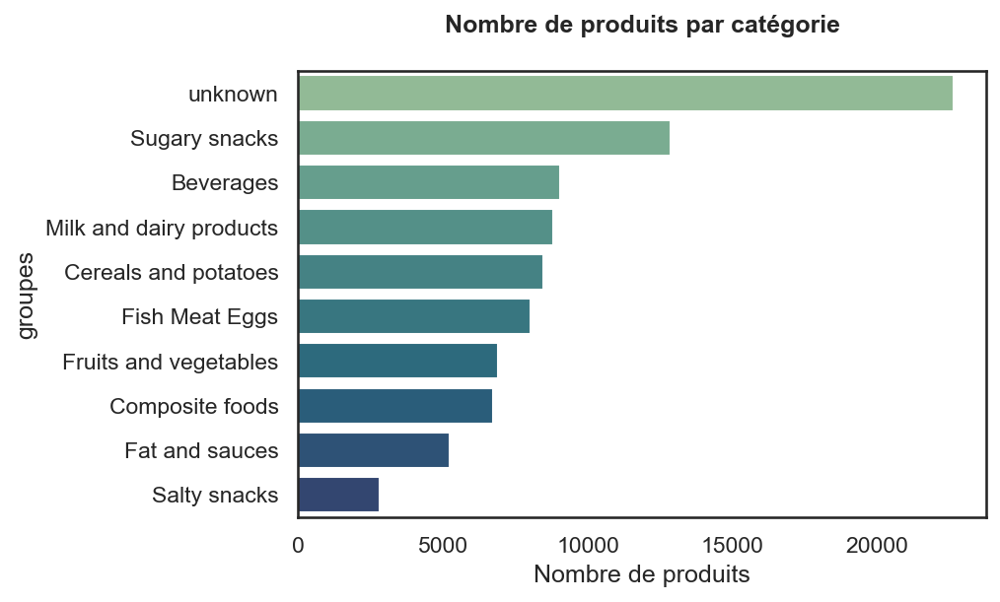

In [20]:
fig = plt.figure()
ax = plt.axes()
y = data["pnns_groups_1"].value_counts(normalize=False)
sns.barplot(x=y,y=y.index, palette="crest")
ax = ax.set(xlabel='Nombre de produits', ylabel='groupes')
plt.title("Nombre de produits par catégorie""\n", fontweight='bold')
plt.show()

<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

### <div class="alert alert-block alert-info"><a name="C225">2.2.5. Variable 'pnns_groups2'</a></div>

In [21]:
print("Le nombre de catégories pour 'pnns_groups_2' est", len(data['pnns_groups_2'].unique()))
print("Le taux de remplissage de 'categories' est de", (data['pnns_groups_2'].notnull().sum()*100/data.shape[0]))
print("Les différentes catégories sont:")
for category in data['pnns_groups_2'].unique():
    print(category)

Le nombre de catégories pour 'pnns_groups_2' est 43
Le taux de remplissage de 'categories' est de 29.457371591036623
Les différentes catégories sont:
nan
unknown
Vegetables
Biscuits and cakes
Bread
Legumes
Pizza pies and quiche
Meat
Sweets
Non-sugared beverages
Sweetened beverages
Dressings and sauces
One-dish meals
vegetables
Soups
Chocolate products
Alcoholic beverages
Fruits
Sandwich
Cereals
Milk and yogurt
Fats
Cheese
Appetizers
Nuts
Breakfast cereals
Artificially sweetened beverages
Fruit juices
Eggs
Fish and seafood
Dried fruits
Ice cream
Processed meat
Potatoes
Dairy desserts
Fruit nectars
pastries
Tripe dishes
fruits
Salty and fatty products
cereals
legumes
nuts


Après le nettoyage des données, il sera possible de choisir une variable pour les catégories en fonction des besoins.

<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>


# <div class="alert alert-block alert-info"><a name="C3">3. Nettoyage du jeu de données</a></div>

<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

## <div class="alert alert-block alert-info"><a name="C31">3.1. Filtrage des produits par la localisation</a></div>

Pour le présent projet, je souhaite conserver que les produits vendus en France. Dans le jeu de données, 3 variables nous informent sur la liste des pays où le produit est vendu:
- countries, 
- countries_tags
- countries_fr.

A quoi ressemble ces 3 variables? Laquelle est la plus adaptée pour filtrer le jeu de données?



In [22]:
# Pour la variable countries
data['countries'].unique()

array(['en:FR', 'US', 'France', ..., 'Malaisie', 'en:HK, en:france',
       'Hong Kong,China'], dtype=object)

In [23]:
# Pour la variable countries_tags
data['countries_tags'].unique()

array(['en:france', 'en:united-states', 'en:united-kingdom',
       'en:france,en:united-states', 'en:canada', 'en:switzerland',
       'en:spain', 'en:germany', 'en:slovenia', 'en:italy', 'en:romania',
       'en:australia', 'en:portugal', 'en:france,en:united-kingdom',
       'en:belgium,en:france,en:netherlands,en:united-kingdom',
       'en:guadeloupe', nan, 'en:united-kingdom,en:united-states',
       'en:canada,en:united-states', 'en:netherlands',
       'en:australia,en:france',
       'en:canada,en:france,en:switzerland,en:united-states',
       'en:france,en:united-states,en:etats-unis', 'en:ireland',
       'en:france,en:reunion', 'en:taiwan', 'en:australia,en:switzerland',
       'en:france,en:germany', 'en:brazil', 'en:belgium,en:france',
       'en:dominican-republic', 'en:united-states,en:australie',
       'en:saudi-arabia', 'en:united-arab-emirates', 'en:iraq',
       'en:kuwait', 'en:moldova', 'en:belgium', 'en:new-caledonia',
       'en:singapore', 'en:finland', 'en:a

In [24]:
# Pour la variable countries_fr
data['countries_fr'].unique()

array(['France', 'États-Unis', 'Royaume-Uni', 'France,États-Unis',
       'Canada', 'Suisse', 'Espagne', 'Allemagne', 'Slovénie', 'Italie',
       'Roumanie', 'Australie', 'Portugal', 'France,Royaume-Uni',
       'Belgique,France,Pays-Bas,Royaume-Uni', 'Guadeloupe', nan,
       'Royaume-Uni,États-Unis', 'Canada,États-Unis', 'Pays-Bas',
       'Australie,France', 'Canada,France,Suisse,États-Unis',
       'France,États-Unis,en:Etats-unis', 'Irlande', 'France,La Réunion',
       'Taiwan', 'Australie,Suisse', 'France,Allemagne', 'Brésil',
       'Belgique,France', 'République dominicaine',
       'États-Unis,en:Australie', 'Arabie saoudite',
       'Émirats arabes unis', 'Irak', 'Koweït', 'Moldavie', 'Belgique',
       'Nouvelle-Calédonie', 'Singapour', 'Finlande',
       'Australie,États-Unis', 'France,Suisse',
       'Australie,Nouvelle-Zélande,Singapour,Thaïlande,États-Unis',
       'Polynésie française', 'Panama', 'Costa Rica', 'Mexique',
       'États-Unis,en:Pays-bas', 'Espagne,Royau

Dans la variable 'countries', il semble ne pas y avoir de constance dans la nomemclature des noms de pays alors que les variables 'countries_tags' et 'countries_fr' présente une constance dans la nomenclature des noms des pays.

Afin de ne conserver que les produits vendus en France, je vais filtrer le jeu de données grâce à la variable 'countries_fr'.

In [25]:
masque = data["countries_fr"].str.contains("France")==True
data_france = data[masque]

print("Le nouveau jeu de données se compose de", data_france.shape[0], "lignes et de", data_france.shape[1],"colones.")

Le nouveau jeu de données se compose de 98440 lignes et de 162 colones.


<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

## <div class="alert alert-block alert-info"><a name="C32">3.2. Suppression des variables avec un taux de remplissage faible</a></div>


Je choisi de supprimer les variables avec un taux de remplissage faible. Ce taux de remplissage est défini dans la variable 'seuil'.



In [26]:
# Création d'une copie du jeu de données original
data_cleaned = data_france.copy()

# Seuil pour filtrer les colonnes en fonction de leur taux de remplissage (0 to 100)
seuil = 80

def split_data_by_nan(dataframe,threshold):
    #pourcentage de lignes avec des valeurs manquantes
    s = dataframe.isnull().mean(axis=0).apply(lambda x: x*100)
    # garde les colonnes avec un taux de remplissage supérieur au seuil
    cols_of_interest = s[s<= threshold].index
    return cols_of_interest

# Filtrer les colonnes par le seuil
data_cleaned = data_cleaned[split_data_by_nan(data_cleaned,seuil)]

# Vérification du jeu de données obtenu
print("Avant filtrage, il y a", data.shape[1], "colonnes.")
print("Le nombre de colonnes avec un taux de remplissage inférieur à", 100 - seuil, "% est de", data.shape[1]- data_cleaned.shape[1])
print("Le nouveau jeu de données se compose de", data_cleaned.shape[0], "lignes et de", data_cleaned.shape[1], "colonnes")


Avant filtrage, il y a 162 colonnes.
Le nombre de colonnes avec un taux de remplissage inférieur à 20 % est de 102
Le nouveau jeu de données se compose de 98440 lignes et de 60 colonnes


<AxesSubplot:>

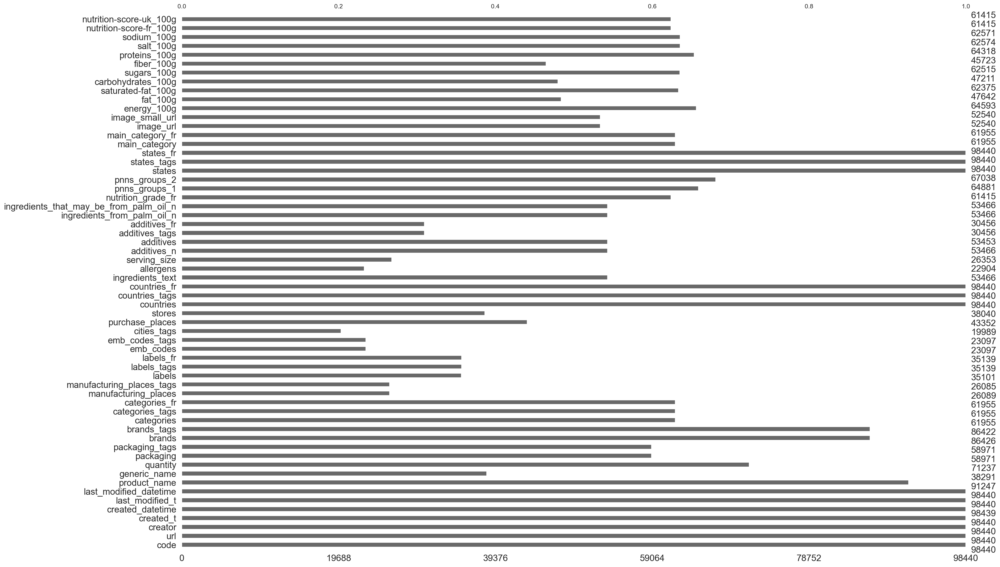

In [27]:
#Pour afficher un histogramme représentant le taux de remplissage
msno.bar(data_cleaned)

<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

## <div class="alert alert-block alert-info"><a name="C33">3.3. Vérification de la qualité de l'identification des produits</a></div>

A présent, je souhaite savoir si chaque ligne du jeu de données correspond à un produit et si les informations permettant d'identifier les produits sont bien renseignées (code et product_name)



In [28]:
# Connaitre le nombre de valeurs manquantes pour product_name
print("Le nombre de produits sans nom est", data_cleaned['product_name'].isnull().sum())

Le nombre de produits sans nom est 7193


Après vérification sur internet, je n'ai pas trouvé d'autre jeu de données pour combler les valeurs manquantes. Je choisi donc de supprimer tous les produits qui n'ont pas de nom.

In [29]:
data_product = data_cleaned.copy()

# Récupération des index des lignes sans nom de produit
index_ligne_nan = data_product.index[data_product['product_name'].isnull()]

# Suppression des lignes sans nom de produits
data_product.drop(index_ligne_nan, inplace=True)

# Vérification du jeu de données obtenu
print("Le nouveau jeu de données se compose de", data_product.shape[0], "lignes et de", data_product.shape[1], "colonnes")

Le nouveau jeu de données se compose de 91247 lignes et de 60 colonnes


In [30]:
# Connaitre le nombre de valeurs manquantes pour code
 
if data_product['code'].isnull().sum() == 0:
    print("Tous les produits sont identifiés par un code")
else:
    print("Certains produits n'ont pas de code pour les identifier")

Tous les produits sont identifiés par un code


A présent, j'ai un jeu de données contenant les produits vendus en France ayant un nom et un code. Pour vérifier la qualité du jeu de données pour ces paramètres, je vais regarder s'il existe des doublons sur les codes.

In [31]:
# Vérifier la présence de doublons
if data_product.loc[data_product['code'].duplicated(keep=False),:].empty:
    print("Il n'y a pas de doublon")
else:
    print(len(data_product.loc[data_product['code'].duplicated(keep=False),:]))
    print(data_product.loc[data_product['code'].duplicated(keep=False),:])

Il n'y a pas de doublon


<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

## <div class="alert alert-block alert-info"><a name="C34">3.4. Valeurs aberrantes</a></div>

Le but de cette étape de nettoyage est d'éliminer les valeurs aberrantes concernant les variables dont le nom se termine par \_100g. Il est reconnu que:
- les valeurs de ces variables (à l'exception de l'énergie) ne peuvent pas être supérieures à 100g
- les valeurs de ces variables (à l'exception du score de nutrition) ne peuvent pas être négatives
- l'énergie d'un produit ne peut pas être supérieure à 3700 kJ (quantité maximale qu'un produit peut avoir)
- la quantité de sucre ne peut pas être supérieure à la quantité de glucides
- la somme des nutriments ne peut pas être supérieure à 100g
- le score de nutrition doit être compris entre -15 et 40

A quoi ressemble notre jeu de données pour les variables contentant \_100g?



In [32]:
data_product.loc[:,'energy_100g':'nutrition-score-fr_100g'].describe()

,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g
count,6.422200e+04,47290.000000,62023.000000,46857.000000,62156.000000,45500.000000,63948.000000,62215.000000,62212.000000,61072.000000
mean,1.170739e+03,13.330031,5.425187,27.741972,13.424597,2.559569,7.763841,1.160091,0.456749,8.678543
std,1.286997e+04,16.930537,8.539554,27.417070,19.082011,4.642360,7.893419,4.303711,1.694356,9.044405
min,0.000000e+00,0.000000,0.000000,0.000000,-0.100000,0.000000,0.000000,0.000000,0.000000,-15.000000
25%,4.270000e+02,1.300000,0.300000,4.000000,1.000000,0.000000,1.800000,0.080000,0.031496,1.000000
50%,1.035000e+03,6.800000,2.000000,14.500000,4.100000,1.300000,6.000000,0.558800,0.220000,9.000000
75%,1.649000e+03,21.000000,7.400000,53.000000,17.800000,3.200000,11.000000,1.244600,0.490000,15.000000
max,3.251373e+06,380.000000,210.000000,190.000000,105.000000,178.000000,100.000000,211.000000,83.000000,40.000000


Avec la fonction describe, il est possible de voir:
- qu'il y a des valeurs d'énergie supérieures à 3700 kJ
- que les valeurs des scores de nutrition sont comprises entre -15 et 40 ce qui semble correcte.
- qu'il y a des valeurs aberrantes pour certaines autres variables. En effet, ces variables ne peuvent prendre des valeurs qu'entre 0 et 100. Hors certaines valeurs sont inférieures à 0 et d'autres supérieures à 100.

<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

### <div class="alert alert-block alert-info"><a name="C341">3.4.1. Valeurs nutritionnelles supérieures à 100g ou négatives</a></div>



In [33]:
# Identification des produits avec des valeurs aberrantes
nom_colonne = data_product.loc[:,'fat_100g':'nutrition-score-fr_100g'].columns
nom_colonne = nom_colonne[:-1]

for s in nom_colonne:
    if len(data_product[['code', 'product_name',s]].loc[data_product[s]>100]) != 0:
        print("Pour la variable",s, ",il y a des valeurs supérieurs à 100")
        print(data_product[['code', 'product_name',s]].loc[data_product[s]>100])
        print("\n")
    if len(data_product[['code', 'product_name',s]].loc[data_product[s]<0]) != 0:
        print("Pour la variable",s, ",il y a des valeurs inférieurs à 0")
        print(data_product[['code', 'product_name',s]].loc[data_product[s]<0])
        print("\n")

Pour la variable fat_100g ,il y a des valeurs supérieurs à 100
                 code                                product_name  fat_100g
245311  3596710288755  mini choux goût fromage de chèvre - poivre     380.0
305054  8032942610032                    Graine de couscous moyen     105.0


Pour la variable saturated-fat_100g ,il y a des valeurs supérieurs à 100
                 code                                product_name  \
245311  3596710288755  mini choux goût fromage de chèvre - poivre   

        saturated-fat_100g  
245311               210.0  


Pour la variable carbohydrates_100g ,il y a des valeurs supérieurs à 100
                 code                                product_name  \
155609  0838619000254                             Beurre d'érable   
202571  3229820787909                      Sirop d'Agave brun bio   
234726  3473710080032                           Palets pur beurre   
239347  3560070740338                               Sirop d'agave   
245311  359671028

Le nombre de valeurs concernées n'étant pas très élevé, j'ai vais éssayer de corriger ces valeurs. Pour cela, je vais retrouver les informations concernant les produits sur le web en utilisant leur code barre.

### Pour la variable fat_100g

Il y a des valeurs supérieures à 100:

|code                | product_name  | fat_100g|
|--------------------|:-------------:|---------:|  
|3596710288755 | mini choux goût fromage de chèvre - poivre |    380.0|
|8032942610032  |  Graine de couscous moyen |    105.0|

In [34]:
if 'fat_100g' in data_product.columns:
    # Pour remplacer la valeur 380 des mini choux par 57
    data_product['fat_100g'].replace(380.0, 57.0, inplace = True)
    # Pour remplacer la valeur 105 de la semoule par 1.5
    data_product['fat_100g'].replace(105.0, 1.5, inplace = True)
    # Vérification des modifications
    print(data_product[['code', 'product_name','fat_100g']].loc[data_product['fat_100g']>100])
else:
    print("Cette colonne n'a pas été conservé")

Empty DataFrame
Columns: [code, product_name, fat_100g]
Index: []


### Pour la variable saturated_fat_100g

Il y a des valeurs supérieures à 100:
        
|code                | product_name  | satured_fat_100g|
|--------------------|:-------------:|---------:|  
|3596710288755|mini choux goût fromage de chèvre - poivre|210.0|

In [35]:
if 'saturated-fat_100g' in data_product.columns:
    # Pour remplacer la valeur 210 des mini choux par 31,5
    data_product['saturated-fat_100g'].replace(210.0, 31.5, inplace = True)
    # Vérification des modifications
    print(data_product[['code', 'product_name','saturated-fat_100g']].loc[data_product['saturated-fat_100g']>100])
else:
    print("Cette colonne n'a pas été conservé")

Empty DataFrame
Columns: [code, product_name, saturated-fat_100g]
Index: []


### Pour la variable carbohydrates_100g

il y a des valeurs supérieures à 100

|code                | product_name  | carbohydrates_100g|
|--------------------|:-------------:|---------:|                                              
|0838619000254  |   Beurre d'érable  | 164.0  |
|3229820787909   |   Sirop d'Agave brun bio   |104.0|
|3473710080032   |    Palets pur beurre  | 106.0|
|3560070740338  |     Sirop d'agave   |105.0|
|3596710288755 | mini choux goût fromage de chèvre - poivre|   190.0 |
|4016249015732 |  Sirop d agave pur   |103.5|
|8935000901649  |  Banane sèche  |  139.0|

                 
               

In [36]:
if 'carbohydrates_100g' in data_product.columns:
    # Pour remplacer la valeur 164 du beurre d'érable par 54
    data_product['carbohydrates_100g'].replace(164.0, 54, inplace = True)

    # Pour remplacer la valeur 104 du sirop d'agave par 100 (Cette valeur)
    data_product['carbohydrates_100g'].replace(104.0, 100, inplace = True)

    # Pour remplacer la valeur 106 des palets pur beurre par 58,6
    data_product['carbohydrates_100g'].replace(106.0, 58.6, inplace = True)

    # Pour remplacer la valeur 105 du sirop d'agave par 100
    data_product['carbohydrates_100g'].replace(105.0, 100, inplace = True)

    # Pour remplacer la valeur 190 des mini choux par 28,5
    data_product['carbohydrates_100g'].replace(190.0, 28.5, inplace = True)

    # Pour remplacer la valeur 103.5 du sirop d'agave par 100
    data_product['carbohydrates_100g'].replace(103.5, 100, inplace = True)

    # Pour remplacer la valeur 139 des bananes sèche par 69.8
    data_product['carbohydrates_100g'].replace(139.0, 69.8, inplace = True)
    # Vérification des modifications
    print(data_product[['code', 'product_name','carbohydrates_100g']].loc[data_product['carbohydrates_100g']>100])
else:
    print("Cette colonne n'a pas été conservé")

Empty DataFrame
Columns: [code, product_name, carbohydrates_100g]
Index: []


### Pour la variable sugars_100g

Il y a des valeurs supérieures à 100:

|code                | product_name  | Sugars_100g|
|--------------------|:-------------:|---------:|
|3229820787909 | Sirop d'Agave brun bio   |     104.0|
|3560070740338  |         Sirop d'agave|        105.0|
|4016249015732   |    Sirop d agave pur |       103.5|


Il y a des valeurs inférieures à 0:

|code                | product_name  | Sugars_100g|
|--------------------|:-------------:|---------:|
|3161712000928|  Caprice des dieux |      -0.1|

In [37]:
if 'sugars_100g' in data_product.columns:
    # Pour remplacer la valeur 104 du sirop d'agave par 100 (Cette valeur)
    data_product['sugars_100g'].replace(104.0, 100, inplace = True)

    # Pour remplacer la valeur 105 du sirop d'agave par 100
    data_product['sugars_100g'].replace(105.0, 100, inplace = True)

    # Pour remplacer la valeur 103.5 du sirop d'agave par 100
    data_product['sugars_100g'].replace(103.5, 100, inplace = True)
    # Vérification des modifications
    print(data_product[['code', 'product_name','sugars_100g']].loc[data_product['sugars_100g']>100])
else:
    print("Cette colonne n'a pas été conservé")

Empty DataFrame
Columns: [code, product_name, sugars_100g]
Index: []


In [38]:
if 'sugars_100g' in data_product.columns:
    # Pour remplacer la valeur -0.1 par 0.8
    data_product['sugars_100g'].replace(-0.1, 0.8, inplace = True)

    # Vérification
    print(data_product[['code', 'product_name','sugars_100g']].loc[data_product['sugars_100g']<0])
else:
    print("Cette colonne n'a pas été conservé")


Empty DataFrame
Columns: [code, product_name, sugars_100g]
Index: []


### Pour la variable fiber_100g

Pour cette variable, il n'y a qu'une seule valeur supérieure à 100. Celle-ci concerne du chocolat aux noisettes. Le taux de fibres n'étant pas renseigné, je prefère le modifier pour qu'il soit null.

|code                | product_name  | fiber_100g|
|--------------------|:-------------:|---------:|
|7622210988768|  Milka Schmunzelhase Alpenmilch 175G |      178.0|

In [39]:
if 'fiber_100g' in data_product.columns:
    # Pour remplacer la valeur -0.1 par 0.8
    data_product['fiber_100g'].replace(178, 0., inplace = True)

    # Vérification
    print(data_product[['code', 'product_name','fiber_100g']].loc[data_product['fiber_100g']>100])
else:
    print("Cette colonne n'a pas été conservé")


Empty DataFrame
Columns: [code, product_name, fiber_100g]
Index: []


### Pour la variable salt_100g 

Il y a des valeurs supérieures à 100 pour:

|code                | product_name  | salt_100g|
|--------------------|:-------------:|---------:|
| 3423720002432      |   Keeny Bio   |  211.0   |
| 3445850070259      |Sel de Guérande Label Rouge |     125.0|

In [40]:
if 'salt_100g' in data_product.columns:
    # Pour remplacer la valeur 211 par 0.4
    data_product['salt_100g'].replace(211, 0.4, inplace = True)

    # Pour remplacer la valeur 125 du sel de guérande par 98,4
    data_product['salt_100g'].replace(125., 98.4, inplace = True)

    # Vérification
    print(data_product[['code', 'product_name','salt_100g']].loc[data_product['salt_100g']>100])
else:
    print("Cette colonne n'a pas été conservé")

Empty DataFrame
Columns: [code, product_name, salt_100g]
Index: []


### Pour la variable vitamin-b1_100g

Il y a des valeurs supérieures à 100

|code                | product_name  | vitamin-b1_100g|
|--------------------|:-------------:|---------:|
|0064100589940 | Céréales rice krispies     |       161.0|

In [41]:
if 'vitamin-b1_100g' in data_product.columns:
    # Pour remplacer la valeur 161 dpar 0.001
    data_product['vitamin-b1_100g'].replace(161., 0.001, inplace = True)
    # Vérification
    print(data_product[['code', 'product_name','vitamin-b1_100g']].loc[data_product['vitamin-b1_100g']>100])
else:
    print("Cette colonne n'a pas été conservé")

Cette colonne n'a pas été conservé


<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

### <div class="alert alert-block alert-info"><a name="C342">3.4.2. Somme des nutriments supérieure à 100g</a></div>



Pour chaque produit, la somme des nutriments (glucides, lipides, protéines) doit être égale à 100. Est-ce le cas dans notre jeu de données?
Si la somme est supérieure à 100, les informations renseignées pour le produit sont inexactes. Ce produit sera donc supprimé de notre jeu de données.



In [42]:
#Avant ce nettoyage, la taille du jeu de données est:
data_product.shape

(91247, 60)

In [43]:
# Pour connaître le nombre de porduit avec une somme supérieure à 100
print("Le nombre de produits avec une somme supérieure à 100 est:",len(data_product[data_product["fat_100g"] + data_product['carbohydrates_100g'] + data_product["proteins_100g"] + data_product["salt_100g"]>100]))

Le nombre de produits avec une somme supérieure à 100 est: 121


In [44]:
#Pour connaitre les index des produits avec une somme supérieure à 100g
masque = data_product.loc[(data_product["fat_100g"] + data_product['carbohydrates_100g'] + data_product["proteins_100g"] + data_product["salt_100g"])>100]

# Pour garder uniquement les produits avec une somme inférieure à 100
data_product1 = data_product.drop(masque.index)
print("Le nouveau jeu de données se compose de", data_product1.shape[0], "lignes et de", data_product1.shape[1], "colonnes")

Le nouveau jeu de données se compose de 91126 lignes et de 60 colonnes


<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

### <div class="alert alert-block alert-info"><a name="C343">3.4.3. Valeurs énergétiques supérieures à 3700 kJ</a></div>

Combien de produits ont une valeur énergetique supérieure à 3700 kJ? <br>
Pour ces produits, les valeurs sont peut-être de mauvaises entrées et il sera possible par la suite d'estimer une valeur énergétique.



In [45]:
print("Informations sur la variable 'energy_100g'")
print("Moyenne=", data_product1['energy_100g'].mean(), '=/-', data_product1['energy_100g'].std())
print("valeur minimale=",data_product1['energy_100g'].min()) 
print("valeur maximale=",data_product1['energy_100g'].max()) 

Informations sur la variable 'energy_100g'
Moyenne= 1168.7785104756556 =/- 12881.979465542396
valeur minimale= 0.0
valeur maximale= 3251373.0


Il y a clairement des valeurs aberrantes. Combien de produits concernent-elles?

In [46]:
valeur_superieure = data_product1['energy_100g']>3700
data_valeur_sup = data_product1[valeur_superieure]    

print("Il y a", data_valeur_sup.shape[0],"produits avec des valeurs d'énergie supérieures à 3700 kJ")

Il y a 248 produits avec des valeurs d'énergie supérieures à 3700 kJ


Pour ces produits, je choisi de supprimer les valeurs d'énergie en conservant le produit.

In [47]:
print("Avant le changement, le nombre de produit sans énergie est", data_product1["energy_100g"].isnull().sum())

data_product1.loc[data_product1['energy_100g']>3700, 'energy_100g'] = None


print("Après le changement, le nombre de produit sans énergie est", data_product1["energy_100g"].isnull().sum())

Avant le changement, le nombre de produit sans énergie est 27025
Après le changement, le nombre de produit sans énergie est 27273


In [48]:
#Pour vérification
print("Informations sur la variable 'energy_100g'")
print("Moyenne=", data_product1['energy_100g'].mean(), '=/-', data_product1['energy_100g'].std())
print("valeur minimale=",data_product1['energy_100g'].min()) 
print("valeur maximale=",data_product1['energy_100g'].max()) 

Informations sur la variable 'energy_100g'
Moyenne= 1102.7550044633765 =/- 761.0269276646828
valeur minimale= 0.0
valeur maximale= 3700.0


<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

### <div class="alert alert-block alert-info"><a name="C344">3.4.4. Quantité de sucres supérieure à la quantité de glucides</a></div>

La quantité de sucre d'un produit est forcément inférieure à la quantité de glucides. Je vais donc vérifier que c'est bien le cas dans notre jeu de données. Si des produits ont une quantité de sucres supérieure, je le supprimerais du jeu de données.



In [49]:
data_product2 = data_product1.copy()
# Vérification du taux de remplissage des variables 'carbohydrates_100g', 'sugars_100g'
nom_variable = ['carbohydrates_100g', 'sugars_100g']

nombre_valeur_manquante = []
liste_index = []
for nom in nom_variable:
    nombre_valeur_manquante.append(data_product2[nom].isnull().sum())
    liste_index.append(data_product2[nom].isnull().index)

if nombre_valeur_manquante.count(nombre_valeur_manquante[0])==len(nombre_valeur_manquante):
    print("Pour toutes les variables considérées, le nombre de valeurs manquantes est",nombre_valeur_manquante[0])
    if liste_index.count(liste_index[0])==len(liste_index):
        print("Ce sont les valeurs pour les mêmes produits qui sont manquantes")

else:
    print("Les nombres de valeurs manquantes sont différents entre chaque variable. Ils sont de: ")
    print("-", nombre_valeur_manquante[0],"pour les glucides")
    print("-", nombre_valeur_manquante[1],"pour les sucres")


Les nombres de valeurs manquantes sont différents entre chaque variable. Ils sont de: 
- 44390 pour les glucides
- 29090 pour les sucres


In [50]:
# Quel est le nombre de produits avec plus de sucres que de glucides?
data_product_sucres = data_product2.loc[data_product1["carbohydrates_100g"] - data_product2["sugars_100g"] <0]

print("Le nombre de produits avec plus de sucres que de glucides est de", data_product_sucres.shape[0])


Le nombre de produits avec plus de sucres que de glucides est de 100


In [51]:
print("Avant suppression, le jeu de données se compose de", data_product2.shape[0], "lignes et de", data_product2.shape[1], "colonnes")

#Suppression des produits qui ont plus de sucres que de glucides
data_product_sucres.index
data_product3 = data_product2.drop(data_product_sucres.index)
print("Après suppression, le jeu de données se compose de",data_product3.shape[0], "lignes et de", data_product3.shape[1], "colonnes")

Avant suppression, le jeu de données se compose de 91126 lignes et de 60 colonnes
Après suppression, le jeu de données se compose de 91026 lignes et de 60 colonnes


<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

### <div class="alert alert-block alert-info"><a name="C345">3.4.5. Cohérence entre nutrition_grade et nutrition-score</a></div>

Le nutri-score est renseigné dans 3 variables:
- nutrition-score-fr_100g
- nutrition-score-uk_100g
- nutrition_grade_fr

Est-ce que nutrition-score-fr et nutrition-score-uk ont les mêmes valeurs?
Est-ce qu'il y a des valeurs manquantes? Si oui, sont-elles les mêmes pour ces 3 variables?



In [52]:
# Vérification du taux de remplissage des variables nutrition-score-fr_100g, nutrition-score-uk_100f, nutrition_grade_fr
nom_variable = ['nutrition-score-fr_100g', 'nutrition-score-uk_100g', 'nutrition_grade_fr']

nombre_valeur_manquante = []
liste_index = []
for nom in nom_variable:
    nombre_valeur_manquante.append(data_product3[nom].isnull().sum())
    liste_index.append(data_product3[nom].isnull().index)

if nombre_valeur_manquante.count(nombre_valeur_manquante[0])==len(nombre_valeur_manquante):
    print("Pour toutes les variables considérées, le nombre de valeurs manquantes est",nombre_valeur_manquante[0])
    if liste_index.count(liste_index[0])==len(liste_index):
        print("Ce sont les valeurs pour les mêmes produits qui sont manquantes")

else:
    print("Les nombres de valeurs manquantes sont différents entre chaque variable. Ils sont de: ", nombre_valeur_manquante)


Pour toutes les variables considérées, le nombre de valeurs manquantes est 30167
Ce sont les valeurs pour les mêmes produits qui sont manquantes


Est-ce que nutrition-score-fr et uk contiennent les mêmes valeurs?

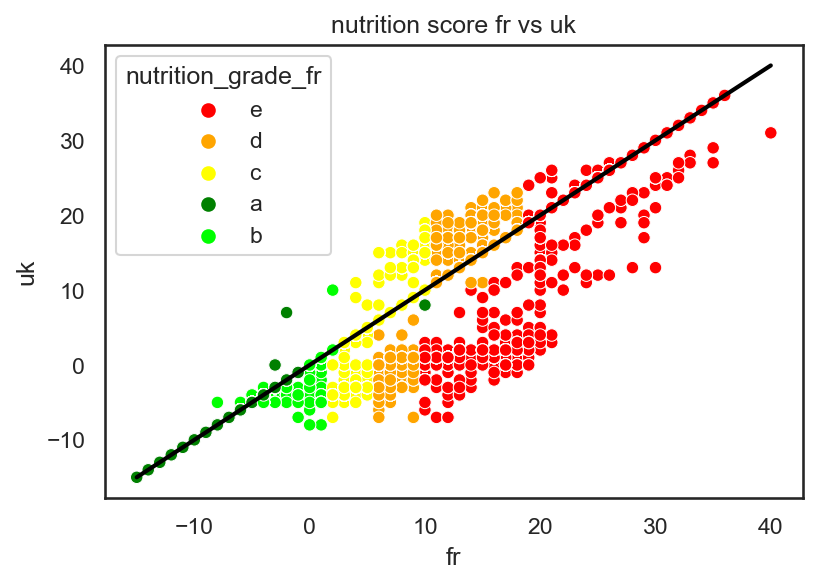

In [53]:
fig = plt.figure()

sns.scatterplot(data= data_product3 , x = "nutrition-score-fr_100g", 
                y= "nutrition-score-uk_100g", hue="nutrition_grade_fr", palette=["red", "orange","yellow","Green","lime"])

plt.plot([-15,40],[-15,40], color = 'black', linewidth = 2)
plt.title('nutrition score fr vs uk')
plt.xlabel('fr')
plt.ylabel('uk')

plt.show()

Pour certains produits, les nutri-scores sont les mêmes alors que pour d'autres ce n'est pas le cas. 
Pour expliquer cette différence, il pourrait y avoir une différence dans le calcul du nutri-score entre la France et l'Angleterre. Comme nous nous interessons aux produits consommés en France et que le nutrition grade correspond aux données francaises, je choisi de supprimer la colonne du nutrition-score-uk_100g

In [54]:
#Suppression de la colonne "nutrition-score-uk_100g"
data_product4 = data_product3.copy()
nombre_colonne_avant = data_product4.shape[1]
data_product4.drop("nutrition-score-uk_100g", axis = 1, inplace = True)

print("Le nombre de colonnes supprimées est", nombre_colonne_avant -data_product4.shape[1] )

Le nombre de colonnes supprimées est 1


Est-ce que les nutrition_grade_fr correspondent au nutrition-score-fr?

Les Nutri-Scores sont définis par:

|Nutri-score pour les aliments|Nutri-score pour les boissons|Nutrition_grade|
|:--------:|:-------:|:-------:|
|-15 à -1|eaux|A|
|0 à 2|min à 1|B|
|3 à 10| 2 à 5| C|
|11 à 18|6 à 9|D|
|19 à max|10 à max|E|


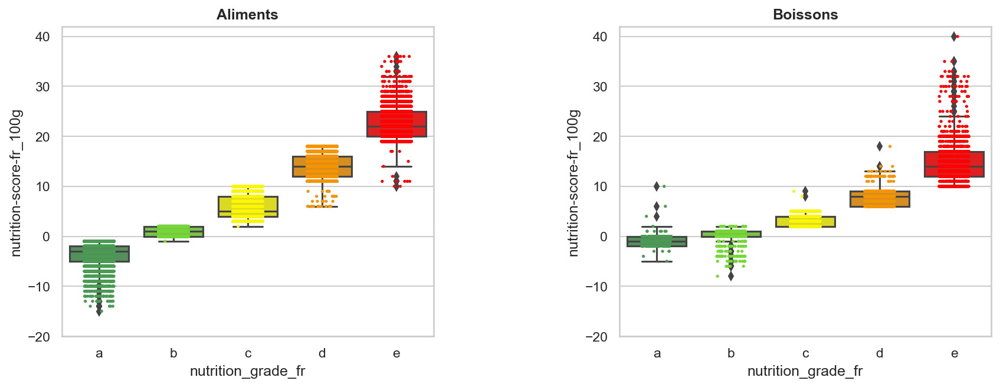

In [55]:
data_box = data_product4.copy()

# Récupération des index des lignes sans nutrition grade
index_ligne_nan = data_box.index[data_box['nutrition_grade_fr'].isnull()]

# Suppression des lignes sans nutrition grade
data_box.drop(index_ligne_nan, inplace=True)

colors = ["#499A53", "#74D834", "#FBF605", "#F49402", "#FF0000"]

sns.set_theme(style="whitegrid", context="notebook")

fig = plt.figure(figsize = (15, 5))
plt.gcf().subplots_adjust(left = 0.3, bottom = 0.3,
                       right = 1, top = 1, wspace = 0.5, hspace = 0.5)

data_box_solides = data_box[(data_box["pnns_groups_1"]!= "Beverages")]
ax1 = fig.add_subplot(1, 2, 1)
ax1 = sns.boxplot(x = "nutrition_grade_fr", y = "nutrition-score-fr_100g", data=data_box_solides, order = ['a','b','c','d','e'], palette = colors)
ax1 = sns.stripplot(x = "nutrition_grade_fr", y = "nutrition-score-fr_100g", data=data_box_solides,jitter=0.2, size=2.5,order = ['a','b','c','d','e'], palette = colors)
ax1.set_ylim(-20,42)
plt.title("Aliments", fontweight='bold')

data_box_boissons = data_box[(data_box["pnns_groups_1"] == "Beverages")]
ax2 = fig.add_subplot(1, 2, 2)
ax2 = sns.boxplot(x = "nutrition_grade_fr", y = "nutrition-score-fr_100g", data=data_box_boissons,order = ['a','b','c','d','e'], palette = colors)
ax2 = sns.stripplot(x = "nutrition_grade_fr", y = "nutrition-score-fr_100g", data=data_box_boissons,jitter=0.2, size=2.5,order = ['a','b','c','d','e'], palette = colors)
ax2.set_ylim(-20,42)
plt.title("Boissons", fontweight='bold')

#plt.savefig('fig valeur nutriscore avant nettoyage.png', dpi=500)
plt.show()


Pour les aliments solides, il y a quelques valeurs qui ne correspondent pas entre le nutrition score et la note.
Pour les boissons, le nombre de valeurs qui ne correspondent pas est plus grand.

In [56]:
# Pour les aliments, je souhaite enlever les note et score pour les produits pour lesquelles ils ne correspondent pas
data_product5 = data_product4.copy()

liste_grade = ['a','b','c','d','e']
liste_min_score = [-15.,0,3,11,19]
liste_max_score = [-1., 2,10,18,40]


print("Avant le nettoyage, le nombre de produits sans score et sans note est", data_product5['nutrition_grade_fr'].isnull().sum())

for i in range(len(liste_grade)):
    print("Pour la note", liste_grade[i])
    data_i = data_product5.loc[(data_product5["pnns_groups_1"]!= "Beverages")& (data_product5['nutrition_grade_fr'] == liste_grade[i])]
    data_i = data_i.loc[(data_i['nutrition-score-fr_100g'] < liste_min_score[i]) | (data_i['nutrition-score-fr_100g'] > liste_max_score[i])]
    print("Le nombre de valeurs qui ne correspondent pas est", data_i.shape[0])
    if data_i.shape[0] !=0:
        valeur_index = data_i.index.tolist()
        data_product5.loc[valeur_index, "nutrition_grade_fr"] = None
        data_product5.loc[valeur_index, "nutrition-score-fr_100g"] = None

        
print("Après le changement, le nombre de produits sans note est", data_product5["nutrition_grade_fr"].isnull().sum())
print("Après le changement, le nombre de produits sans score est", data_product5["nutrition-score-fr_100g"].isnull().sum())

Avant le nettoyage, le nombre de produits sans score et sans note est 30167
Pour la note a
Le nombre de valeurs qui ne correspondent pas est 0
Pour la note b
Le nombre de valeurs qui ne correspondent pas est 1
Pour la note c
Le nombre de valeurs qui ne correspondent pas est 1
Pour la note d
Le nombre de valeurs qui ne correspondent pas est 30
Pour la note e
Le nombre de valeurs qui ne correspondent pas est 13
Après le changement, le nombre de produits sans note est 30212
Après le changement, le nombre de produits sans score est 30212


In [57]:
# Pour les boissons, je souhaite enlever les note et score pour les produits pour lesquelles ils ne correspondent pas

liste_min_score_boissons = [-15,-15,2,6,10]
liste_max_score_boissons = [40, 1,5,9,40]

print("Avant le nettoyage, le nombre de produits sans score et sans note est", data_product5['nutrition_grade_fr'].isnull().sum())


for i in range(len(liste_grade)):
    print("Pour la note", liste_grade[i])
    
    data_j= data_product5.loc[(data_product5["pnns_groups_1"]== "Beverages")& (data_product5['nutrition_grade_fr'] == liste_grade[i])]
    data_j= data_j.loc[(data_j['nutrition-score-fr_100g'] < liste_min_score_boissons[i]) | (data_j['nutrition-score-fr_100g'] > liste_max_score_boissons[i])]
    print("Le nombre de valeurs qui ne correspondent pas est", data_j.shape[0])

    if data_j.shape[0] !=0:
        valeur_index = data_j.index.tolist()
        data_product5.loc[valeur_index, "nutrition_grade_fr"] = None
        data_product5.loc[valeur_index, "nutrition-score-fr_100g"] = None

print("Après le changement, le nombre de produits sans énergie est", data_product5["nutrition_grade_fr"].isnull().sum())
print("Après le changement, le nombre de produits sans énergie est", data_product5["nutrition-score-fr_100g"].isnull().sum())

Avant le nettoyage, le nombre de produits sans score et sans note est 30212
Pour la note a
Le nombre de valeurs qui ne correspondent pas est 0
Pour la note b
Le nombre de valeurs qui ne correspondent pas est 13
Pour la note c
Le nombre de valeurs qui ne correspondent pas est 2
Pour la note d
Le nombre de valeurs qui ne correspondent pas est 52
Pour la note e
Le nombre de valeurs qui ne correspondent pas est 0
Après le changement, le nombre de produits sans énergie est 30279
Après le changement, le nombre de produits sans énergie est 30279


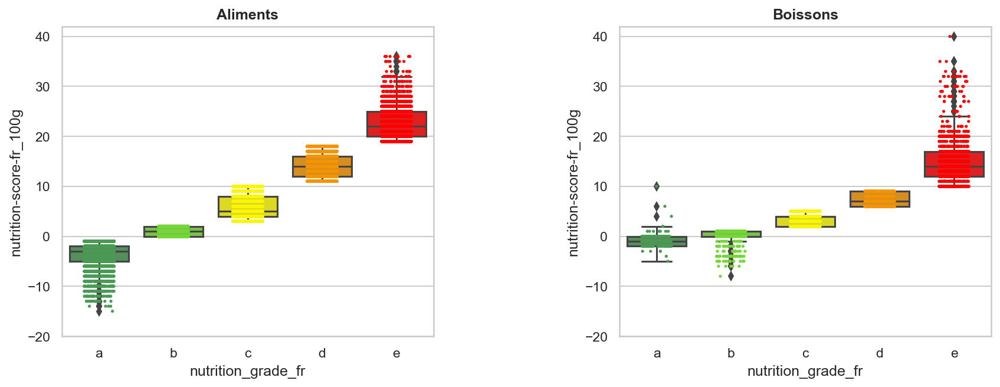

In [58]:
# Je refais le graphique pour vérifier que les valeurs abérrantes ont été traité

data_box = data_product5.copy()

# Récupération des index des lignes sans nutrition grade
index_ligne_nan = data_box.index[data_box['nutrition_grade_fr'].isnull()]

# Suppression des lignes sans nutrition grade
data_box.drop(index_ligne_nan, inplace=True)

colors = ["#499A53", "#74D834", "#FBF605", "#F49402", "#FF0000"]


sns.set_theme(style="whitegrid", context="notebook")
fig = plt.figure(figsize = (15, 5))
plt.gcf().subplots_adjust(left = 0.3, bottom = 0.3,
                       right = 1, top = 1, wspace = 0.5, hspace = 0.5)

data_box_solides = data_box[(data_box["pnns_groups_1"]!= "Beverages")]
ax1 = fig.add_subplot(1, 2, 1)
ax1 = sns.boxplot(x = "nutrition_grade_fr", y = "nutrition-score-fr_100g", data=data_box_solides, order = ['a','b','c','d','e'], palette = colors)
ax1 = sns.stripplot(x = "nutrition_grade_fr", y = "nutrition-score-fr_100g", data=data_box_solides,jitter=0.2, size=2.5,order = ['a','b','c','d','e'], palette = colors)
ax1.set_ylim(-20,42)
#plt.title("Boîte à moustaches des scores de nutrition ""\n""en fonction de la note pour les aliments""\n")
plt.title("Aliments", fontweight='bold')
    

data_box_boissons = data_box[(data_box["pnns_groups_1"] == "Beverages")]
ax2 = fig.add_subplot(1, 2, 2)
ax2 = sns.boxplot(x = "nutrition_grade_fr", y = "nutrition-score-fr_100g", data=data_box_boissons,order = ['a','b','c','d','e'], palette = colors)
ax2 = sns.stripplot(x = "nutrition_grade_fr", y = "nutrition-score-fr_100g", data=data_box_boissons,jitter=0.2, size=2.5,order = ['a','b','c','d','e'], palette = colors)
ax2.set_ylim(-20,42)
#plt.title("Boîte à moustaches des scores de nutrition ""\n""en fonction de la note pour les boissons""\n")
plt.title("Boissons", fontweight='bold')
plt.show()
                

<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

## <div class="alert alert-block alert-info"><a name="C35">3.5. Traitements des valeurs manquantes</a></div>

Le jeu de données contient-il beaucoup de valeurs manquantes?



(91026, 59)


<AxesSubplot:>

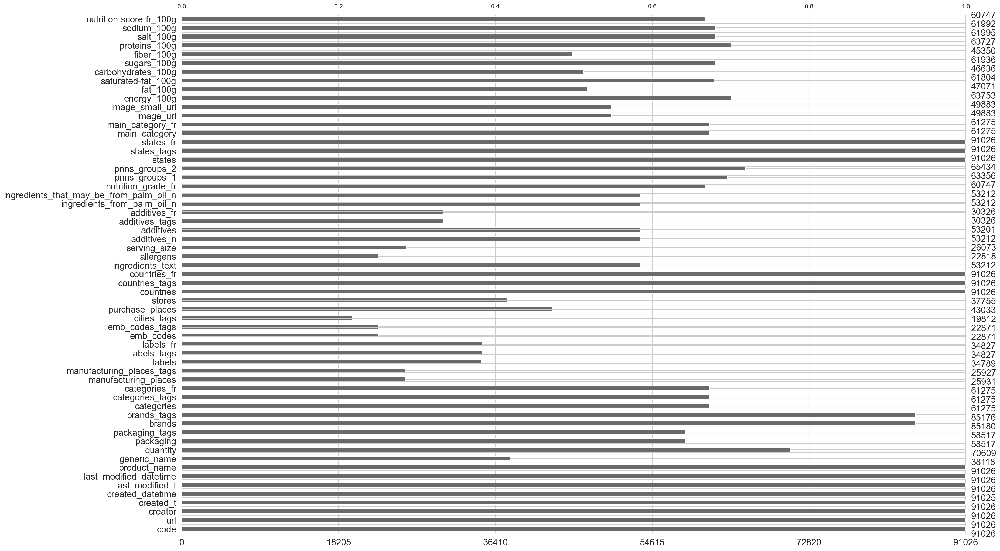

In [59]:
print(data_product5.shape)
msno.bar(data_product5)

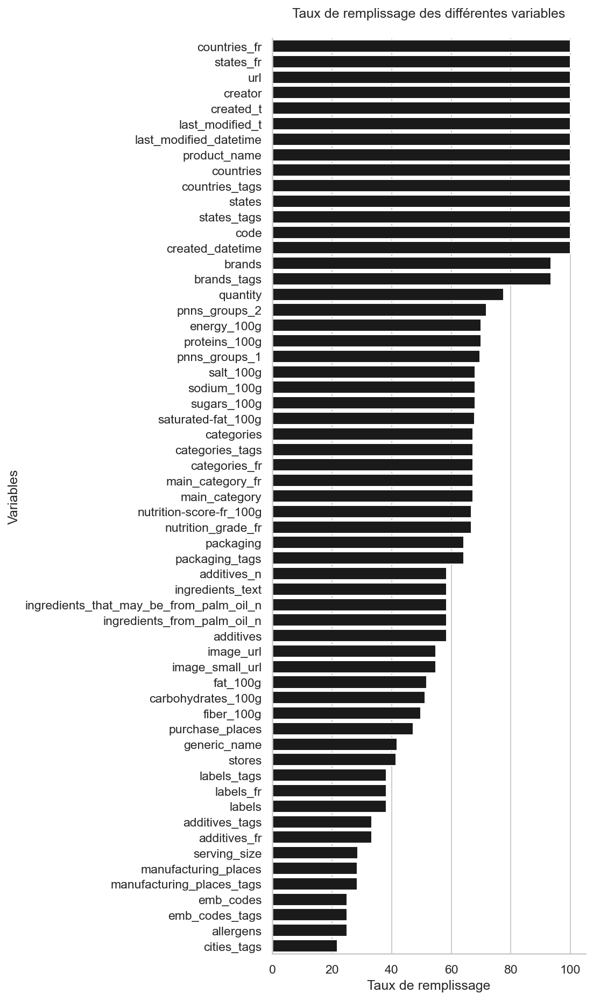

In [60]:
# Autre façon de représenter le taux de remplissage du jeu de données

pourcentage_valeurs_manquantes = data_product5.notnull().sum() / len(data_product5)*100
pourcentage_valeurs_manquantes = pourcentage_valeurs_manquantes.sort_values(ascending=False)
noms_variable = pourcentage_valeurs_manquantes.index
valeurs = pourcentage_valeurs_manquantes.values

plt.figure(figsize =(5,15))
ax = plt.axes()
ax = sns.barplot(x=valeurs,y=noms_variable, color='k' )
plt.title("Taux de remplissage des différentes variables""\n")
ax.set_xlabel("Taux de remplissage")

ax.set_ylabel("Variables")
sns.despine()
plt.show()

Le jeu de données contient de nombreuses valeurs manquantes pour les variables pertinentes pour le projet. Il manque notamment:
- des valeurs pour l'energie pour 100 g
- des valeurs pour le nutri-score 
- des valeurs pour les différents nutriments
- des valeurs pour les catégories

<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

### <div class="alert alert-block alert-info"><a name="C351">3.5.1. Suppression des produits sans aucune information nutritionnelle</a></div>

Pour ce projet, les variables interessantes concernent les valeurs nutritives des produits. Ces informations sont contenues dans les variables suivi de \_100g.
Je veux donc vérifier si tout les produits du nouveau jeu de données contiennent au moins une valeur dans ces colonnes (à l'exception de la colonne nutrition-score-fr_100g)



In [61]:
data_product6 = data_product5.copy()

In [62]:
composant = ['energy_100g','fat_100g', 'carbohydrates_100g','sugars_100g', 'proteins_100g']


df_subset_columns = data_product6[composant]
print('Le nombre de lignes sans information nutritionnelle est de: {}'.format(df_subset_columns.isnull().all(axis=1).sum()))

# Suppression des produits sans informations pour les nutriments et l'énergie
data_product6= data_product6[df_subset_columns.notnull().any(axis=1)]
print("Le nouveau jeu de données se compose de",data_product6.shape[0], "lignes et de", data_product6.shape[1], "colonnes")

Le nombre de lignes sans information nutritionnelle est de: 26497
Le nouveau jeu de données se compose de 64529 lignes et de 59 colonnes


Le jeu de données contient-il des produits pour lesquelles toutes les valeurs \_100g sont égales à 0?
Pour les produits alimentaires, au moins un des trois principaux composants (lipides, protéines, glucides) doit être différents de 0. 
Je souhaite enlever du jeu de données, les produits dont les trois champs ('fat_100g', 'proteins_100g' et 'carbohydrates_100g) sont égales à 0.

In [63]:
produit_alimentaire = data_product6.loc[data_product6["pnns_groups_1"]!= "Beverages"]

# Récupération des index des lignes
index_ligne = produit_alimentaire.index[(produit_alimentaire['fat_100g'] ==0.) 
                                        & (produit_alimentaire['proteins_100g'] ==0.) 
                                        & (produit_alimentaire['carbohydrates_100g']==0.)]

# Suppression des lignes
data_product6.drop(index_ligne, inplace=True)

print("Le nouveau jeu de données se compose de",data_product6.shape[0], "lignes et de", data_product6.shape[1], "colonnes")

Le nouveau jeu de données se compose de 64457 lignes et de 59 colonnes


<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

### <div class="alert alert-block alert-info"><a name="C352">3.5.2. Valeurs manquantes pour les valeurs nutritives</a></div>



#### <div class="alert alert-block alert-info"><a name="C3521">3.5.2.1. Valeurs manquantes pour les glucides</a></div>



Pour les produits où la colonne 'carbohydrates_100g' n'est pas renseignée, la colonne 'sugars_100g' l'est-elle? Si oui, je souhaite mettre ces valeurs dans la colonne 'carbohydrates_100g'

In [64]:
data_product6.loc[(data_product6["carbohydrates_100g"].isnull()) & (data_product6["sugars_100g"].notnull())]

print("Le nombre de produits avec la colonne 'carbohydrates' non renseignée mais la colonne 'sugars' renseignée est", 
      len(data_product6.loc[(data_product6["carbohydrates_100g"].isnull()) & (data_product6["sugars_100g"].notnull())]))

Le nombre de produits avec la colonne 'carbohydrates' non renseignée mais la colonne 'sugars' renseignée est 17296


In [65]:
#Remplissage de la colonne 'carbohydrates' par les valeurs de la colonne 'sugars'
data_product6.loc[(data_product6["carbohydrates_100g"].isnull()) & (data_product6["sugars_100g"].notnull()),
                  ["carbohydrates_100g"]] = data_product6["sugars_100g"]

# Vérification
print("Le nombre de produit avec la colonne 'carbohydrates' non renseignée mais la colonne 'sugars' renseignée est", 
      len(data_product6.loc[(data_product6["carbohydrates_100g"].isnull()) & (data_product6["sugars_100g"].notnull())]))

Le nombre de produit avec la colonne 'carbohydrates' non renseignée mais la colonne 'sugars' renseignée est 0


In [66]:
if data_product6['carbohydrates_100g'].isnull().sum() != 0:
    print("Les valeurs manquantes seront remplacées par 0")
else:
    print("Il n'y a plus de valeur manquante")

Les valeurs manquantes seront remplacées par 0


<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

#### <div class="alert alert-block alert-info"><a name="C3522">3.5.2.2. Valeurs manquantes pour les lipides</a></div>




In [67]:
print("Il y a", data_product6['fat_100g'].isnull().sum(), "valeurs manquantes dans la colonne 'fat_100g'")

Il y a 17458 valeurs manquantes dans la colonne 'fat_100g'


La colonne 'fat_100g' est-elle mal renseignée?

In [68]:
data_product6[['code', 'product_name','energy_100g','fat_100g', 
               'carbohydrates_100g', 'proteins_100g']].loc[(data_product6["fat_100g"].isnull())]

,code,product_name,energy_100g,fat_100g,carbohydrates_100g,proteins_100g
190,0000010187319,Mini Confettis,1753.0,NaN,87.70,0.60
191,0000010207260,Praliné Amande Et Noisette,2406.0,NaN,50.30,9.50
234,0000069161025,Tarte Poireaux Et Lardons,1079.0,NaN,1.00,7.50
307,0000606009841,Beignets framboises,1272.0,NaN,12.70,5.80
456,00011730,Cookies Cranberry & Orange,1799.0,NaN,41.20,4.40
...,...,...,...,...,...,...
320698,96103890,Eat Natural Protein Packed,1996.0,NaN,22.00,22.00
320734,9778564312457,Nature cheddar and red onion crisps,2155.0,NaN,1.80,7.80
320740,9782211109758,Verrine Cheescake Myrtille,1084.0,NaN,10.50,8.70
320741,9782401029101,Fiche Brevet,4.0,NaN,1.00,10.00


Vérification pour quelques produits sur le site https://www.food-watching.com/:<br>
190: fat non renseigné - les autres valeurs correspondent<br>
191: fat non renseigné - les autres valeurs correspondent<br>
234: fat non renseigné (valeur trouvé sur internet = 17g, glucides = 18g)<br>
307: fat non renseigné - les autres valeurs correspondent<br>

320741: ne correspond pas du tout à un produit alimentaire<br>

Quelles méthodes utiliser pour estimer au plus juste la quantité de lipides?

Je vais tester deux méthodes ici:
1. La fonction iterativImputer (création d'une variable ii-fat_100g)
2. La déduction par rapport aux valeurs de glucides et de protéines (lipide = 100 - (glucide + proteines))(création d'une variable deduction-fat_100g)

Une fois ces deux variables créées, je les comparerais: valeurs moyennes, valeurs minimales, valeurs maximales, nombres de valeurs abérrantes.



**Remplacement des valeurs manquantes avec la méthode IterativeImputer**

Je vais tout d'abord voir les corrélations entre les différentes variables pour connaitre celles qui sont le mieux corrélées avec la variable 'fat_100g'.

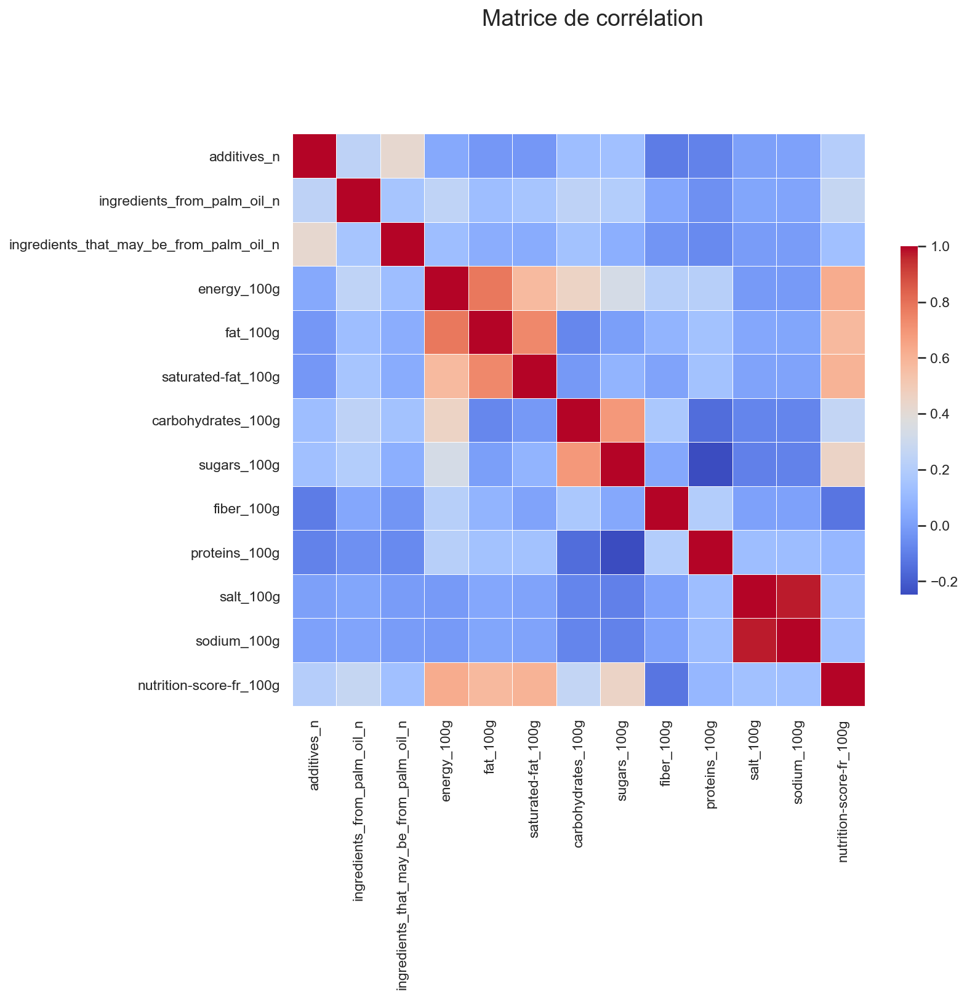

In [69]:
# Création d'une copie du jeu de données
data_test = data_product6.copy()

# Calcul de la matrice de corrélation des variables quantitatives
corrmat = data_test.corr()

# Représentation graphique de la matrice de corrélation
fig = plt.figure(figsize=(10, 10))
fig.text(0.45, 0.93, "Matrice de corrélation", ha='center', fontsize = 18)
sns.heatmap(corrmat, square=True, linewidths=0.01, cmap="coolwarm",cbar_kws={"shrink":.5})
plt.show()

La variable 'fat_100g' est fortement correlé avec la variable 'energy_100g'.
Pour estimer les valeurs manquantes de 'fat_100g', je vais utiliser cette colonne.

In [70]:
# Vérification de la corrélation entre les 2 variables
data_test[['energy_100g','fat_100g']].corr()

,energy_100g,fat_100g
energy_100g,1.000000,0.781367
fat_100g,0.781367,1.000000


In [71]:
# Création d'un jeu de données avec uniquement les colonnes 'energy_100g', 'fat_100g'
liste_colonnes_a_garder = ('energy_100g','fat_100g')

colonnes_to_drop = data_test.columns.tolist()
for a in liste_colonnes_a_garder:
    colonnes_to_drop.remove(a)

for b in colonnes_to_drop:
    del data_test[b]

data_test.shape

(64457, 2)

In [72]:
print("Informations sur la variable 'fat_100g'")
print("Moyenne=", data_test['fat_100g'].mean(), '=/-', data_test['fat_100g'].std())
print("valeur minimale=",data_test['fat_100g'].min()) 
print("valeur maximale=",data_test['fat_100g'].max()) 

Informations sur la variable 'fat_100g'
Moyenne= 13.288393404816738 =/- 16.740376023052637
valeur minimale= 0.0
valeur maximale= 100.0


In [73]:
# Importation des librairies nécessaires pour la fonction iterative imputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import BayesianRidge

In [74]:
# Estimation des valeurs manquantes
impute_it = IterativeImputer()
data_test.iloc[:,:] = impute_it.fit_transform(data_test)

In [75]:
# Vérification que les valeurs manquantes ont bien été intégré dans le jeu de données
print("Il y a", data_test['fat_100g'].isnull().sum(), "valeurs manquantes dans la colonne 'fat_100g'")
print("Il y a", data_test['energy_100g'].isnull().sum(), "valeurs manquantes dans la colonne 'energy_100g'")

Il y a 0 valeurs manquantes dans la colonne 'fat_100g'
Il y a 0 valeurs manquantes dans la colonne 'energy_100g'


In [76]:
# Ajout d'une colonne 'ii-fat_100g' au jeu de données
print("Avant l'ajout de cette nouvelle colonne, le jeu de données a", data_product6.shape[1],"colonnes")

data_product6["ii-fat_100g"] = data_test['fat_100g']
print("Après l'ajout de cette nouvelle colonne, le jeu de données a", data_product6.shape[1],"colonnes")

Avant l'ajout de cette nouvelle colonne, le jeu de données a 59 colonnes
Après l'ajout de cette nouvelle colonne, le jeu de données a 60 colonnes


In [77]:
print("Il y a", data_product6['fat_100g'].isnull().sum(), "valeurs manquantes dans la colonne 'fat_100g'")
print("Il y a", data_product6['ii-fat_100g'].isnull().sum(), "valeurs manquantes dans la colonne 'ii-fat_100g''")

Il y a 17458 valeurs manquantes dans la colonne 'fat_100g'
Il y a 0 valeurs manquantes dans la colonne 'ii-fat_100g''


**Remplacement des valeurs manquantes par déduction**

In [78]:
deduction_fat = 100 - (data_product6['carbohydrates_100g']+data_product6['proteins_100g'])
data_product6["deduction-fat_100g"] = deduction_fat

In [79]:
print("Il y a", data_product6['fat_100g'].isnull().sum(), "valeurs manquantes dans la colonne 'fat_100g'")
print("Il y a", data_product6['deduction-fat_100g'].isnull().sum(), 
      "valeurs manquantes dans la colonne 'deduction-fat_100g''")

Il y a 17458 valeurs manquantes dans la colonne 'fat_100g'
Il y a 886 valeurs manquantes dans la colonne 'deduction-fat_100g''


**Comparaison des deux méthodes**


In [80]:
data_product6[['fat_100g', 'ii-fat_100g', 'deduction-fat_100g']].describe()

,fat_100g,ii-fat_100g,deduction-fat_100g
count,46999.000000,64457.000000,63571.000000
mean,13.288393,13.405817,68.011917
std,16.740376,15.808638,26.272275
min,0.000000,-5.664455,-100.000000
25%,1.300000,1.400000,45.100000
50%,6.800000,8.125867,78.400000
75%,21.000000,22.000000,88.600000
max,100.000000,100.000000,100.000000


La méthode IterativeImputer semble donner des estimations plus juste. Il y a tout de même des produits avec une valeur négative. Combien sont-ils?

In [81]:
if len(data_product6['ii-fat_100g'].loc[data_product6['ii-fat_100g']<0]) != 0:
    print("Pour la variable 'ii-fat_100g',il y a",  
          len(data_product6['ii-fat_100g'].loc[data_product6['ii-fat_100g']<0]),"des valeurs inférieurs à 0")


Pour la variable 'ii-fat_100g',il y a 3345 des valeurs inférieurs à 0


In [82]:
data_product6[['code', 'product_name','energy_100g','ii-fat_100g',
               'carbohydrates_100g', 'proteins_100g']].loc[data_product6['ii-fat_100g']<0]

,code,product_name,energy_100g,ii-fat_100g,carbohydrates_100g,proteins_100g
664,00071543,Aloe Vera Grape & Apple Juice,155.0,-3.002562,8.5,0.1
886,00088978,Fresh Drinking Coconut,0.0,-5.664455,0.0,0.0
7386,0011210600959,Tabasco Pfeffersauce,67.0,-4.513830,0.0,1.0
13768,00172899,Diet Cola,21.0,-5.303811,0.1,0.1
15159,0019281700141,Boisson Passion,209.0,-2.075193,12.1,0.0
...,...,...,...,...,...,...
320524,9546549536453,Total 2%,305.0,-0.426537,3.8,9.9
320627,9556156042865,Lait De Soja,209.0,-2.075193,7.7,2.0
320629,9556156046641,Yeo's Soy Bean Drink,222.0,-1.851938,8.3,2.0
320660,9557305000576,Lait Soja Brique 1L,234.0,-1.645856,8.0,2.0


Vérification pour quelques produits sur le site https://www.food-watching.com/:<br>

|Index|Quantité de lipides|
|:-----:|:---------------:|
|884|0.1g|
|7386|0g|
|15159| 0g|
|320627|1.1g|

Je choisi de remplacer ces valeurs négatives par 0

In [83]:
data_product7 = data_product6.copy()

# Remplacement des valeurs négatives par 0
data_product7.loc[data_product7['ii-fat_100g']<0., 'ii-fat_100g'] = None
data_product7['ii-fat_100g'].fillna(0, inplace = True)

# Pour vérifier
data_product7[['fat_100g', 'ii-fat_100g']].describe()


,fat_100g,ii-fat_100g
count,46999.000000,64457.000000
mean,13.288393,13.543486
std,16.740376,15.675193
min,0.000000,0.000000
25%,1.300000,1.400000
50%,6.800000,8.125867
75%,21.000000,22.000000
max,100.000000,100.000000


In [84]:
# Suppression de la colonne 'deduction-fat_100g'
del data_product7['deduction-fat_100g']

print("Le nouveau jeu de données se compose de",data_product7.shape[0], "lignes et de", data_product7.shape[1], "colonnes")

Le nouveau jeu de données se compose de 64457 lignes et de 60 colonnes


<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

#### <div class="alert alert-block alert-info"><a name="C3523">3.5.2.3. Valeurs manquantes pour les proteines</a></div>




In [85]:
print("Il y a", data_product7['proteins_100g'].isnull().sum(), "valeurs manquantes dans la colonne 'proteins_100g'")

Il y a 802 valeurs manquantes dans la colonne 'proteins_100g'


In [86]:
data_product7[['code', 'product_name','energy_100g','ii-fat_100g',
               'carbohydrates_100g', 'proteins_100g']].loc[data_product7['proteins_100g'].isnull()]

,code,product_name,energy_100g,ii-fat_100g,carbohydrates_100g,proteins_100g
774,0008295616241,Balsamic vinegar of Modena,63.00,0.000000,3.00,NaN
13153,0016229912529,sriracha chili sauce,280.00,0.000000,13.30,NaN
35740,0038900719609,Sunny fruit,256.00,0.100000,14.00,NaN
59482,00481724,6 Cumberland sausages,1070.00,21.300000,0.15,NaN
86334,0074323083651,Cajeta Quemada,573.00,4.175961,NaN,NaN
...,...,...,...,...,...,...
317099,8852646023408,Sweet Chilli Sauce,962.00,0.000000,58.00,NaN
317148,8853662023236,sweet sour sauce thai pride,194.00,0.000000,11.00,NaN
317511,8902301820764,Concentré de saveurs aux épices pour Butter Ch...,1740.00,20.500000,37.00,NaN
318330,90357473,Coca cola zéro,1.21,0.000000,0.00,NaN


Vérification pour quelques produits sur le site https://www.food-watching.com/:<br>

|Index|Quantité de protéines|
|:-----:|:---------------:|
|774|0g|
|59482|13.9g|
|13153|2.4g|
|317511| 1.4g|

Les informations concerntants ces produits semblent mal renseignées. Je préfère les enlever du jeu de données.

In [87]:
data_product7.dropna(subset=["proteins_100g"], inplace=True)
print("Il y a", data_product7['proteins_100g'].isnull().sum(), "valeurs manquantes dans la colonne 'proteins_100g'")

Il y a 0 valeurs manquantes dans la colonne 'proteins_100g'


<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

#### <div class="alert alert-block alert-info"><a name="C3524">3.5.2.4. Valeurs manquantes pour les autres nutriments</a></div>



In [88]:
# Identification du nom des colonnes
nom_colonne = data_product7.loc[:,'fat_100g':'nutrition-score-fr_100g'].columns
nom_colonne_remplir = nom_colonne[:-1]

for nom in nom_colonne_remplir:
    data_product7[nom].fillna(0, inplace = True)

print("Le nouveau jeu de données se compose de",data_product7.shape[0], "lignes et de", data_product7.shape[1], "colonnes")

Le nouveau jeu de données se compose de 63655 lignes et de 60 colonnes


<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

### <div class="alert alert-block alert-info"><a name="C353">3.5.3. Valeurs manquantes pour l'énergie</a></div>


In [89]:
# Connaitre le nombre de valeurs manquantes pour energy_100g
data_product8 = data_product7.copy()
nombre_ligne_sans_energy = data_product8['energy_100g'].isnull().sum()
print("Le nombre de produits sans energy_100g est", data_product8['energy_100g'].isnull().sum())

Le nombre de produits sans energy_100g est 301


Pour traiter les valeurs manquantes pour cette variable, je vais essayer de la calculer. Afin de vérifier si le calcul est juste, je vais calculer l'énergie pour tout les produits puis je comparerais l'énergie calculée à l'énergie donnée dans le jeu de données quand celle-ci est présente.
Pour le calcul de l'energie, il faut prendre en compte que:

|Eléments| Valeur kJ pour 1g| Nom de la variable|
|------|-------|-----|
|Protéines| 17 kJ| proteins_100g|
|Lipide |38 kJ| fat_100g|
|Glucides | 17 kJ | carbohydrates_100g|
|Fibres | 8 kJ| fiber_100g|




In [90]:
# Calcul de l'énergie pour chaque ligne du jeu de données
estimated_energy = ((data_product8['proteins_100g'] * 17)
                    +(data_product8['ii-fat_100g']*37)
                    +(data_product8['carbohydrates_100g']*17)
                    +(data_product8['fiber_100g']*8))


# Ajout de cette valeur à une nouvelle colonne du jeu de données nommé 'estimated_energy_100g'
data_product8["estimated_energy_100g"] = estimated_energy

# Vérification du jeu de données obtenu
print("Le nouveau jeu de données se compose de", data_product8.shape[0], "lignes et de", data_product8.shape[1], "colonnes")

Le nouveau jeu de données se compose de 63655 lignes et de 61 colonnes


Comparaison des valeurs calculées aux valeurs renseignées quand cela est possible

In [91]:
print("Informations sur la variable 'energy_100g'")
print("----------------------------------------------")
print("Nombre de produits:", data_product8['energy_100g'].notnull().sum())
print("Moyenne=", data_product8['energy_100g'].mean(), '=/-', data_product8['energy_100g'].std())
print("valeur minimale=",data_product8['energy_100g'].min()) 
print("valeur maximale=",data_product8['energy_100g'].max()) 
print()
print("Informations sur la variable 'estimated_energy_100g'")
print("----------------------------------------------")
print("Nombre de produits:", data_product8['estimated_energy_100g'].notnull().sum())
print("Moyenne=", data_product8['estimated_energy_100g'].mean(), '=/-', data_product8['estimated_energy_100g'].std())
print("valeur minimale=",data_product8['estimated_energy_100g'].min()) 
print("valeur maximale=",data_product8['estimated_energy_100g'].max()) 

Informations sur la variable 'energy_100g'
----------------------------------------------
Nombre de produits: 63354
Moyenne= 1104.9274680367457 =/- 759.9758458909076
valeur minimale= 0.0
valeur maximale= 3700.0

Informations sur la variable 'estimated_energy_100g'
----------------------------------------------
Nombre de produits: 63655
Moyenne= 1055.806144125042 =/- 745.141764415764
valeur minimale= 0.0
valeur maximale= 4256.020542576317


Pour l'énergie estimé, il y a des valeurs supérieurs à 3700kJ. Combien de produits cela représentent-il?

In [92]:
valeur_superieure = data_product8['estimated_energy_100g']>3700
data_valeur_sup = data_product8[valeur_superieure]    

print("Il y a", data_valeur_sup.shape[0],"produits avec des valeurs d'énergie supérieures à 3700 kJ")

Il y a 4 produits avec des valeurs d'énergie supérieures à 3700 kJ


In [93]:
data_valeur_sup[['code','product_name','energy_100g','fat_100g','proteins_100g',
                 'carbohydrates_100g','estimated_energy_100g']]

,code,product_name,energy_100g,fat_100g,proteins_100g,carbohydrates_100g,estimated_energy_100g
206499,3250391314539,Beurre d'Isigny extra-fin doux,3109.0,100.0,0.7,0.6,3722.100000
212187,3257980204165,huile de pepin de raisin Cora,3700.0,100.0,0.1,0.0,3701.700000
227826,3350033188402,"Gel douche hydratant, Parfum jasmin & fleur de...",3155.0,0.0,49.0,45.0,3761.163887
283105,6091035082004,Eau,418.0,0.0,100.0,100.0,4256.020543


Vérification pour quelques produits sur le site https://www.food-watching.com/:<br>

|Index|Valeur énergétique|Lipides|
|:-----:|:---------------:|:------:|
|206499|3056|82|
|212187|3700|100|
|283105|0|0|

Je vais supprimer ces produits

In [94]:
# Suppression des lignes
data_product8.drop(data_valeur_sup.index, inplace=True)

In [95]:
print("Informations sur la variable 'estimated_energy_100g'")
print("----------------------------------------------")
print("Nombre de produits:", data_product8['estimated_energy_100g'].notnull().sum())
print("Moyenne=", data_product8['estimated_energy_100g'].mean(), '=/-', data_product8['estimated_energy_100g'].std())
print("valeur minimale=",data_product8['estimated_energy_100g'].min()) 
print("valeur maximale=",data_product8['estimated_energy_100g'].max()) 

Informations sur la variable 'estimated_energy_100g'
----------------------------------------------
Nombre de produits: 63651
Moyenne= 1055.6299055764962 =/- 744.8312177919195
valeur minimale= 0.0
valeur maximale= 3700.0


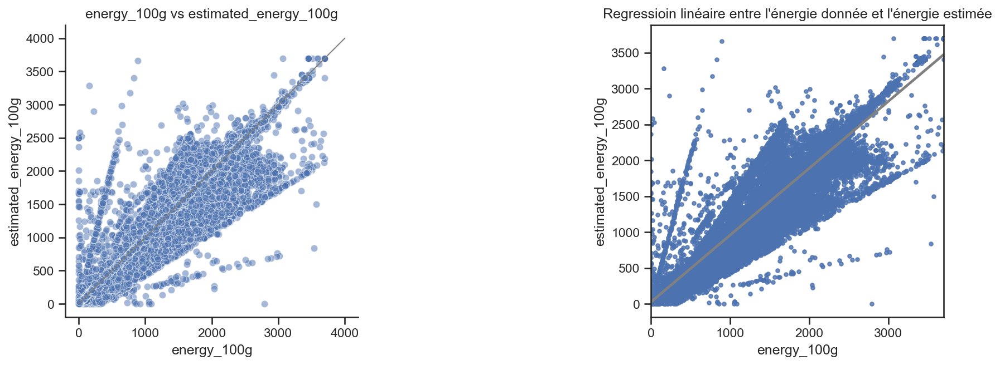

In [96]:
sns.set_theme(style="ticks", context="notebook")
fig = plt.figure(figsize = (15, 5))
plt.gcf().subplots_adjust(left = 0.3, bottom = 0.3,
                       right = 1, top = 1, wspace = 1, hspace = 0.5)
ax1 = fig.add_subplot(1, 2, 1)

ax1 = sns.scatterplot(data = data_product8, x='energy_100g', y='estimated_energy_100g', alpha=0.5)
plt.plot([0,4000],[0,4000], color = 'grey', linewidth = 1)
plt.title('energy_100g vs estimated_energy_100g')
plt.xlabel('energy_100g')
plt.ylabel('estimated_energy_100g')
sns.despine()



ax2 = fig.add_subplot(1, 2, 2)
ax2 = sns.regplot(data = data_product8, x="energy_100g", y = "estimated_energy_100g",
                  scatter_kws={"s": 10},line_kws = {"color": "grey"})
ax2.set_title("Regressioin linéaire entre l'énergie donnée et l'énergie estimée")

plt.show()

Peut-etre que le jeu de données contient des valeurs en kJ et d'autre en kCal? Pour combien de produits les valeurs sont-elles proches? Pour combien de produits sont-elles éloignés?

In [97]:
# Ajout du ratio valeur estimée/valeur renseignée dans une nouvelle colonne du jeu de données nommé 'estimated_energy_100g'
data_product8["ratio"] = np.where(data_product8['energy_100g']<1,data_product8['energy_100g'],
                                  data_product8['estimated_energy_100g']/data_product8['energy_100g'])

# Vérification du jeu de données obtenu
print("Le nouveau jeu de données se compose de", data_product8.shape[0], "lignes et de",
      data_product8.shape[1], "colonnes")

Le nouveau jeu de données se compose de 63651 lignes et de 62 colonnes


In [98]:
print("Informations sur la variable 'ratio'")
print("Moyenne=", data_product8['ratio'].mean(), '=/-', data_product8['ratio'].std())
print("valeur minimale=",data_product8['ratio'].min()) 
print("valeur maximale=",data_product8['ratio'].max()) 
print("valeur manquante = ", data_product8['ratio'].isnull().sum())

Informations sur la variable 'ratio'
Moyenne= 1.127191732782211 =/- 10.92541473536734
valeur minimale= 0.0
valeur maximale= 1532.0
valeur manquante =  301


In [99]:
nombre_produit_total = data_product8.shape[0]
nombre_produits_bien_estime = len(data_product8.loc[(data_product8['ratio']>0.8)&(data_product8['ratio']<1.2)])

print("Le nombre de produit dans mon jeu de données est de", nombre_produit_total)
print("Le nombre de produit avec un ratio compris entre 0.8 et 1.2 est",nombre_produits_bien_estime, "soit", (nombre_produits_bien_estime*100)/nombre_produit_total,"%")

nombre_estime_grand = len(data_product8.loc[data_product8['ratio']>1.2])
print("Le nombre de produit avec un ratio supèrieur à  1.2 est",nombre_estime_grand, "soit", (nombre_estime_grand*100)/nombre_produit_total,"%")                                               

nombre_estime_petit = len(data_product8.loc[data_product8['ratio']<0.8])
print("Le nombre de produit avec un ratio inférieur à 0.8 est",nombre_estime_petit, "soit", (nombre_estime_petit*100)/nombre_produit_total,"%")                                               


Le nombre de produit dans mon jeu de données est de 63651
Le nombre de produit avec un ratio compris entre 0.8 et 1.2 est 50954 soit 80.0521594319021 %
Le nombre de produit avec un ratio supèrieur à  1.2 est 2503 soit 3.9323812665943976 %
Le nombre de produit avec un ratio inférieur à 0.8 est 9889 soit 15.536283797583698 %


- Les produits avec un ratio compris entre à.8 et 1.2 correspondent à des produits avec une valeur d'énergie estimée proche de la valeur renseignée. Les données de ces produits semblent donc être de bonne qualité.
- Les produits avec un ratio supérieur à 1.2 correspondent à des produits pour lesquelles la valeur d'énergie estimée est supérieure à la valeur renseignée. Pour ces produits, la valeur renseignée est-elle en kCal au lieu de kJ?
- Les produits avec un ratio inférieur à 0.8 correspondent à des produits pour lesquelles la valeur d'énergie estimée est inférieure à la valeur renseignée. Pour ces produits, est-ce que les variables glucides, lipides, protéines sont bien renseignées?

**Vérification pour les produits avec un ratio supérieur à 1.2**

1 kJ correspond à 0.239 kCal. 
Pour les produits avec un ratio supérieur à 1.2, est-ce que les valeurs d'énergie estimée se rapprochent de (valeur renseignée / 0.239). Si oui, cela veut dire que la variable 'energy_100g' a été complété avec des valeurs en kCal au lieu de KJ.

In [100]:
data_product8[['code','product_name','energy_100g','ii-fat_100g','proteins_100g','carbohydrates_100g','estimated_energy_100g','ratio']].loc[data_product8['ratio']>1.2]

,code,product_name,energy_100g,ii-fat_100g,proteins_100g,carbohydrates_100g,estimated_energy_100g,ratio
190,0000010187319,Mini Confettis,1753.0,24.440694,0.600,87.70,2412.605660,1.376272
603,00048569,Barbecue Sauce,665.0,7.500000,1.100,67.50,1458.100000,2.192632
7368,0011210008328,Sriracha Thai Chili Sauce,418.0,0.000000,0.000,40.00,680.000000,1.626794
19168,00217477,Mini Snack Raisins,1377.0,17.983457,2.000,67.10,1873.687904,1.360703
20832,0024000165002,Tomates pelées au jus - BIO,21.0,0.100000,1.200,3.40,88.300000,4.204762
...,...,...,...,...,...,...,...,...
320630,9556156046726,Sauce pimentée à l'ail,247.0,0.000000,0.000,17.65,300.050000,1.214777
320681,96068779,Spearmint sans sucres,1017.0,1.300000,0.040,95.87,1678.610000,1.650551
320702,96118580,Fisherman's Friend Miel-Citron,1031.0,1.300000,0.004,95.31,1680.198000,1.629678
320741,9782401029101,Fiche Brevet,4.0,0.000000,10.000,1.00,267.000000,66.750000


In [101]:
data_verif = data_product8.loc[data_product8['ratio']>1.2]
print(data_verif.shape)

energy_verif = data_verif['energy_100g']/0.239
data_verif['energy_verif'] = energy_verif

data_verif["ratio_verif"] = np.where(data_verif['energy_verif']<1,data_verif['energy_verif'],data_verif['estimated_energy_100g']/data_verif['energy_verif'])
data_verif[['code','product_name','energy_100g','estimated_energy_100g','ratio','energy_verif',"ratio_verif"]]

(2503, 62)


<ipython-input-101-d87f749e53d2>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_verif['energy_verif'] = energy_verif
<ipython-input-101-d87f749e53d2>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_verif["ratio_verif"] = np.where(data_verif['energy_verif']<1,data_verif['energy_verif'],data_verif['estimated_energy_100g']/data_verif['energy_verif'])


,code,product_name,energy_100g,estimated_energy_100g,ratio,energy_verif,ratio_verif
190,0000010187319,Mini Confettis,1753.0,2412.605660,1.376272,7334.728033,0.328929
603,00048569,Barbecue Sauce,665.0,1458.100000,2.192632,2782.426778,0.524039
7368,0011210008328,Sriracha Thai Chili Sauce,418.0,680.000000,1.626794,1748.953975,0.388804
19168,00217477,Mini Snack Raisins,1377.0,1873.687904,1.360703,5761.506276,0.325208
20832,0024000165002,Tomates pelées au jus - BIO,21.0,88.300000,4.204762,87.866109,1.004938
...,...,...,...,...,...,...,...
320630,9556156046726,Sauce pimentée à l'ail,247.0,300.050000,1.214777,1033.472803,0.290332
320681,96068779,Spearmint sans sucres,1017.0,1678.610000,1.650551,4255.230126,0.394482
320702,96118580,Fisherman's Friend Miel-Citron,1031.0,1680.198000,1.629678,4313.807531,0.389493
320741,9782401029101,Fiche Brevet,4.0,267.000000,66.750000,16.736402,15.953250


In [102]:
nombre_produit_total = data_verif.shape[0]
nombre_produits_bien_estime = len(data_verif.loc[(data_verif['ratio_verif']>0.8)&(data_verif['ratio_verif']<1.2)])

print("Le nombre de produits du jeu de données est de", nombre_produit_total)
print("Le nombre de produits avec un ratio compris entre 0.8 et 1.2 est",nombre_produits_bien_estime, "soit", (nombre_produits_bien_estime*100)/nombre_produit_total,"%")

nombre_estime_grand = len(data_verif.loc[data_verif['ratio_verif']>1.2])
print("Le nombre de produits avec un ratio supèrieur à  1.2 est",nombre_estime_grand, "soit", (nombre_estime_grand*100)/nombre_produit_total,"%")                                               

nombre_estime_petit = len(data_verif.loc[data_verif['ratio_verif']<0.8])
print("Le nombre de produits avec un ratio inférieur à 0.8 est",nombre_estime_petit, "soit", (nombre_estime_petit*100)/nombre_produit_total,"%")                                               


Le nombre de produits du jeu de données est de 2503
Le nombre de produits avec un ratio compris entre 0.8 et 1.2 est 250 soit 9.988014382740712 %
Le nombre de produits avec un ratio supèrieur à  1.2 est 120 soit 4.794246903715542 %
Le nombre de produits avec un ratio inférieur à 0.8 est 2133 soit 85.21773871354375 %


Dans ce cas, il me semble pertinent de:
- garder les produits pour lesquelles il y a confusion entre kCal et KJ, c'est-à-dire les produits avec un ratio_verif compris entre 0.8 et 1.2
- supprimer les autres produits car les différentes variables ne sont pas renseignées correctement

In [103]:
data_product9 = data_product8.copy()
liste_index = data_verif.index[(data_verif['ratio_verif']<0.8)|(data_verif['ratio_verif']>1.2)]

# Suppression des lignes
data_product9.drop(liste_index, inplace=True)

# Vérification du jeu de données obtenu
print("Le nouveau jeu de données se compose de", data_product9.shape[0], "lignes et de", 
      data_product9.shape[1], "colonnes")

Le nouveau jeu de données se compose de 61398 lignes et de 62 colonnes


**Vérification pour les produits avec un ratio inférieur à 0.8**

In [104]:
data_product8[['code','product_name','energy_100g','ii-fat_100g','proteins_100g','carbohydrates_100g','estimated_energy_100g','ratio']].loc[data_product8['ratio']<0.8]

,code,product_name,energy_100g,ii-fat_100g,proteins_100g,carbohydrates_100g,estimated_energy_100g,ratio
234,0000069161025,Tarte Poireaux Et Lardons,1079.0,12.865753,7.50,1.00,631.732874,0.585480
307,0000606009841,Beignets framboises,1272.0,16.180239,5.80,12.70,913.168850,0.717900
463,00013628,Chicken pad thaï,619.0,4.965943,8.40,2.90,384.639875,0.621389
495,0002000003395,Black & White Crispbread Sticks,1674.0,23.083987,15.00,5.50,1282.607514,0.766193
532,00026857,Cornish Cruncher & Balsamic Onion,1661.0,22.860731,21.50,0.80,1231.347060,0.741329
...,...,...,...,...,...,...,...,...
320660,9557305000576,Lait Soja Brique 1L,234.0,0.000000,2.00,8.00,170.000000,0.726496
320678,96060599,Reglisde,1050.0,12.367722,0.26,0.18,467.645707,0.445377
320734,9778564312457,Nature cheddar and red onion crisps,2155.0,31.344441,7.80,1.80,1367.744324,0.634684
320740,9782211109758,Verrine Cheescake Myrtille,1084.0,12.951621,8.70,10.50,805.609972,0.743183


Après vérification de quelques items sur le site "https://www.food-watching.com/", il semble que les informations concernant ces produits soient males renseignées. Je souhaite donc supprimer ces produits du jeu de données

In [105]:
liste_index = data_product9.index[data_product9['ratio']<0.8]
# Suppression des lignes
data_product9.drop(liste_index, inplace=True)

# Vérification du jeu de données obtenu
print("Le nouveau jeu de données se compose de", data_product9.shape[0], "lignes et de",
      data_product9.shape[1], "colonnes")

Le nouveau jeu de données se compose de 51509 lignes et de 62 colonnes


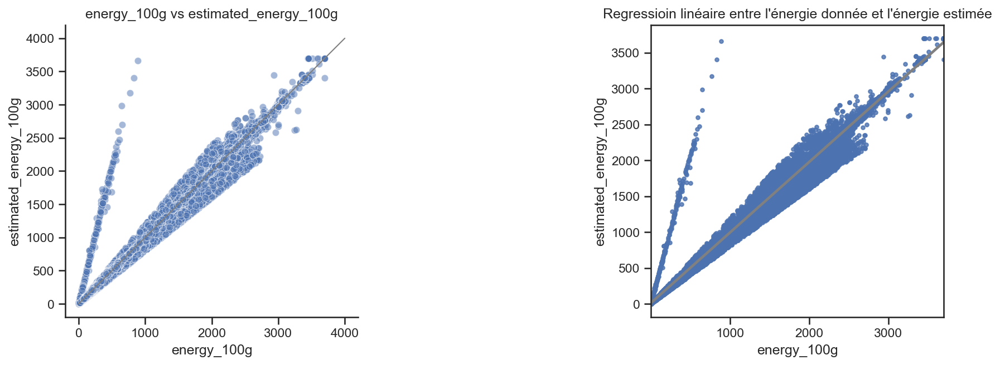

In [106]:
sns.set_theme(style="ticks", context="notebook")
fig = plt.figure(figsize = (15, 5))
plt.gcf().subplots_adjust(left = 0.3, bottom = 0.3,
                       right = 1, top = 1, wspace = 1, hspace = 0.5)
ax1 = fig.add_subplot(1, 2, 1)

ax1 = sns.scatterplot(data = data_product9, x='energy_100g', y='estimated_energy_100g', alpha=0.5)
plt.plot([0,4000],[0,4000], color = 'grey', linewidth = 1)
plt.title('energy_100g vs estimated_energy_100g')
plt.xlabel('energy_100g')
plt.ylabel('estimated_energy_100g')
sns.despine()



ax2 = fig.add_subplot(1, 2, 2)
ax2 = sns.regplot(data = data_product9, x="energy_100g", y = "estimated_energy_100g",
                  scatter_kws={"s": 10},line_kws = {"color": "grey"})
ax2.set_title("Regressioin linéaire entre l'énergie donnée et l'énergie estimée")

plt.show()

<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

# <div class="alert alert-block alert-info"><a name="C4">4. Valeurs manquantes pour la note et/or le score de nutrition</a></div>


## <div class="alert alert-block alert-info"><a name="C41">4.1. Quels sont les valeurs manquantes?</a></div>

Est-ce qu'il y a des valeurs manquantes?



In [107]:
print("Il y a",data_product9['nutrition-score-fr_100g'].isnull().sum(),"valeurs manquantes pour le score de nutrition")
print("Il y a",data_product9['nutrition_grade_fr'].isnull().sum(),"valeurs manquantes pour la note")

Il y a 2782 valeurs manquantes pour le score de nutrition
Il y a 2782 valeurs manquantes pour la note


<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

## <div class="alert alert-block alert-info"><a name="C42">4.2. Le nutri-score est-il corrélé avec d'autres variables?</a></div>

Le nutri-score est-il correlé à d'autres variables? Si c'est le cas, il serait possible d'estimer le nutri-score grâce aux autres variables.



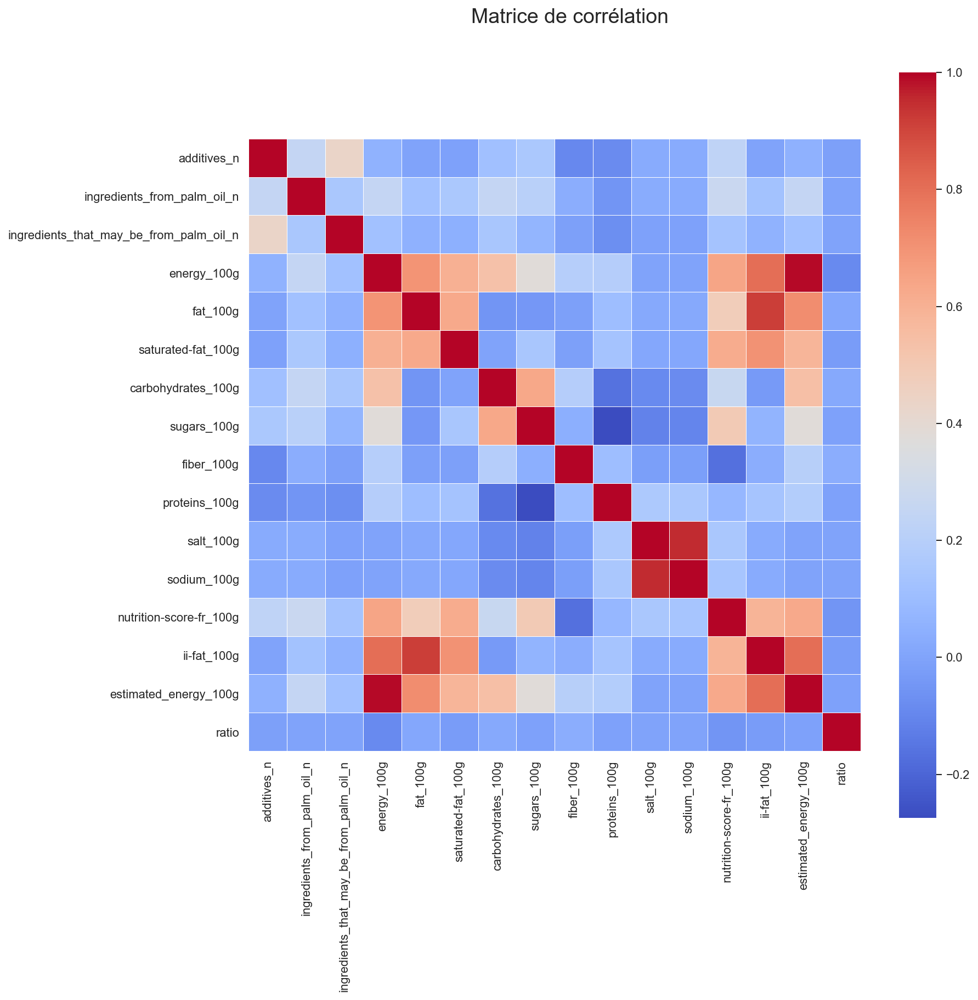

In [108]:
# Calcul de la matrice de corrélation des variables quantitatives
corrmat = data_product9.corr()

# Représentation graphique de la matrice de corrélation
sns.set(context="paper", font_scale = 1.2)
fig = plt.figure(figsize=(12, 12))
fig.text(0.45, 0.93, "Matrice de corrélation", ha='center', fontsize = 18)
sns.heatmap(corrmat, square=True, linewidths=0.01, cmap="coolwarm")
plt.show()

Sur cette matrice de correlation, il est possible de voir que:
- l'energie éstimée est positivement corrélé avec les variables:ii-fat_100g, fat_100g, saturated-fat_100g, carbohydrates_100g et le nutrition score
- le nutrition score est positivement corrélé avec les variables: ii-fat_100g, saturated-fat_100g, sugars_100g, estimated_energy_100g et négativement corrélé avec la quantité de fiber_100g
- les variables salt_100g et sodium_100g sont très fortement corrélés. Ceci semble logique puisque le sodium est l'élément qui compose le sel.


**Suppression des colonnes inutiles**

Pour la suite du projet, il ne parait pas utile de garder les colonnes: 
- salt_100g qui est redondante avec sodium_100g
- fat_100g qui est redondante avec ii-fat_100g
- energy_100g qui est redondante avec estimated_energy_100g
- ratio qui ne sera plus utilisé dans la suite du projet

In [109]:
data_product10 = data_product9.copy()
colonnes_to_drop = ('salt_100g','fat_100g','energy_100g','ratio')

for b in colonnes_to_drop:
    del data_product10[b]
    
# Vérification du jeu de données obtenu
print("Le nouveau jeu de données se compose de", data_product10.shape[0], "lignes et de", data_product10.shape[1], "colonnes")

Le nouveau jeu de données se compose de 51509 lignes et de 58 colonnes


<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

## <div class="alert alert-block alert-info"><a name="C43">4.3. Estimation de la note du nutri-score: modèles de classification</a></div>

### <div class="alert alert-block alert-info"><a name="C431">4.3.1. Prépartion et séléction du jeu de données</a></div>



In [110]:
# Importation des librairies sci-kit learn
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [111]:
data_classification = data_product10.copy()

# Récupération du nom des colonnes
macro_nutriments_labels = []
for col in data_classification.columns:
    if '_100g' in col:
        macro_nutriments_labels.append(col)
        
macro_nutriments_labels.remove('nutrition-score-fr_100g')

In [112]:
# Création d'un set de données pour les modèles de machine learning
y_set = data_classification["nutrition_grade_fr"].dropna()
x_set = data_classification.dropna(subset=["nutrition_grade_fr"])[macro_nutriments_labels]

In [113]:
# Encodage des labels [a,b,c,d,e] en valeur numérique [0,1,2,3,4]
encoder = LabelEncoder()
y_encoded = encoder.fit_transform(y_set)

In [114]:
# Normalization des valeurs numériques
encoder_x = StandardScaler()
x_set_encoded = encoder_x.fit_transform(x_set)

**Sélection des données pour les modèles de machine learning**

In [115]:
# Séparer le training set du testing set
x_train, x_test, y_train, y_test = train_test_split(x_set_encoded, y_encoded, train_size = 0.8, random_state=42)


Text(0.5, 1.0, 'test set')

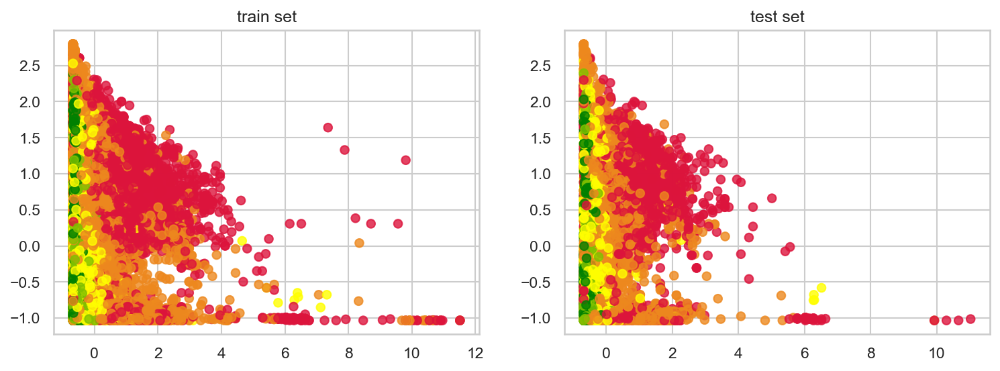

In [116]:
cmap = LinearSegmentedColormap.from_list('GreenYellowRed', ['green', 'yellow', 'crimson'])
sns.set_theme(style="whitegrid", context="notebook")
plt.figure(figsize =(12,4))
plt.subplot(121)
plt.scatter(x_train[:,0], x_train[:,1], c=y_train, alpha=0.8, cmap = cmap)
plt.title('train set')

plt.subplot(122)
plt.scatter(x_test[:,0], x_test[:,1], c=y_test, alpha=0.8, cmap = cmap)
plt.title('test set')

<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

### <div class="alert alert-block alert-info"><a name="C432">4.3.2. Classifieur k-NN</a></div>



In [117]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix

In [118]:
param_grid = {'n_neighbors': np.arange(1,20),
             'metric': ['euclidean', 'manhattan']}

grid = GridSearchCV(KNeighborsClassifier(), param_grid, cv = 5)

grid.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'metric': ['euclidean', 'manhattan'],
                         'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19])})

In [119]:
accuracy_KNN_validation = grid.best_score_
print("L'accuracy pour le model KNN sur les données de validation est de", accuracy_KNN_validation*100,"%")

L'accuracy pour le model KNN sur les données de validation est de 84.11278087577986 %


In [120]:
grid.best_params_

{'metric': 'euclidean', 'n_neighbors': 1}

In [121]:
model_best_KNN = grid.best_estimator_

In [122]:
accuracy_KNN_test = model_best_KNN.score(x_test,y_test)
print("L'accuracy pour le model KNN sur les données test est de", accuracy_KNN_test*100,"%")


L'accuracy pour le model KNN sur les données test est de 84.51672481017853 %


<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

### <div class="alert alert-block alert-info"><a name="C433">4.3.3. Classifieur Random Forest</a></div>


In [123]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [124]:
model_RF = RandomForestClassifier(
                n_estimators=200,
                criterion='gini',
                max_depth=25,
                min_samples_split=2,
                min_samples_leaf=1,
                min_weight_fraction_leaf=0.0,
                max_features=6,
                max_leaf_nodes=None,
                min_impurity_decrease=0.0,
                bootstrap=True,
                oob_score=False,
                n_jobs=None,
                random_state=None,
                verbose=0,
                warm_start=False,
                class_weight=None,
                ccp_alpha=0.0,
                max_samples=None)
model_RF.fit(x_train, y_train)

RandomForestClassifier(max_depth=25, max_features=6, n_estimators=200)

In [125]:
accuracy_RF_validation = cross_val_score(model_RF, x_train, y_train, cv=5).mean()
print("L'accuracy pour le model random forst sur les données de validation est de", accuracy_RF_validation*100,"%")

L'accuracy pour le model random forst sur les données de validation est de 89.52054450169722 %


In [126]:
# Faire une prédiction pour le test set
y_pred_test = model_RF.predict(x_test)

# View accuracy score
accuracy_RF_test = accuracy_score(y_test, y_pred_test)
print("L'accuracy pour le model random forst sur les données test est de", accuracy_RF_test*100,"%")


L'accuracy pour le model random forst sur les données test est de 90.13954442848348 %


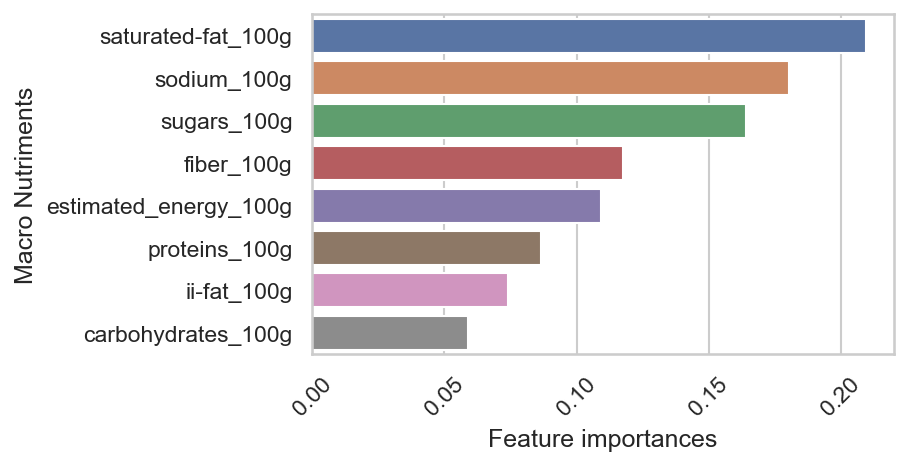

In [127]:
feature_importances = model_RF.feature_importances_

attributes = macro_nutriments_labels
# Les features sont triés par importance pour l'affichage graphique
x, y = [], []
for x_0, y_0 in sorted(zip(feature_importances, attributes), reverse=True) :
    x.append(x_0)
    y.append(y_0)
# Affichage Bar Plot
fig = plt.figure(figsize=(5,3))
sns.barplot(x=x, y=y)
plt.ylabel("Macro Nutriments")
plt.xlabel("Feature importances")
plt.xticks(rotation=45)
plt.show()

<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

### <div class="alert alert-block alert-info"><a name="C434">4.3.4. Séléction du modèle</a></div>



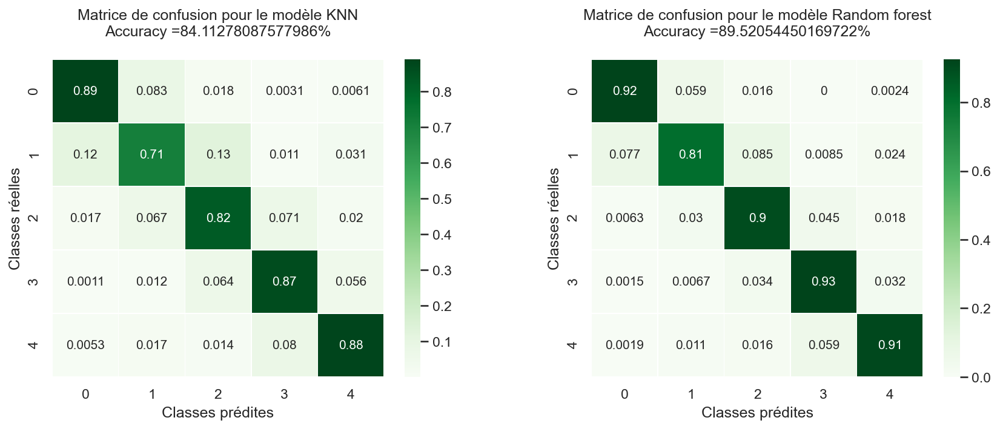

In [128]:
# Création d'une nouvelle figure
fig = plt.figure(figsize = (15, 5))
plt.gcf().subplots_adjust(left = 0.3, bottom = 0.3,
                       right = 1, top = 1, wspace = 0.3, hspace = 0.5)

# Construction de la matrice de confusion pour le modèle KNN
matrix_KNN = confusion_matrix(y_test, model_best_KNN.predict(x_test))
matrix_KNN = matrix_KNN.astype('float') / matrix_KNN.sum(axis=1)[:, np.newaxis]

ax1 = fig.add_subplot(1, 2, 1)
ax1 = sns.heatmap(matrix_KNN, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Greens, linewidths=0.2)
plt.xlabel('Classes prédites')
plt.ylabel('Classes réelles')
ax1.set_title('Matrice de confusion pour le modèle KNN''\n''Accuracy ={accuracy}%''\n'.format(accuracy=accuracy_KNN_validation*100) )


# Construction de la matrice de confusion pour le modèle Random forest
matrix_RF = confusion_matrix(y_test, model_RF.predict(x_test))
matrix_RF = matrix_RF.astype('float') / matrix_RF.sum(axis=1)[:, np.newaxis]

ax2 = fig.add_subplot(1, 2, 2)
ax2 = sns.heatmap(matrix_RF, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Greens, linewidths=0.2)
plt.xlabel('Classes prédites')
plt.ylabel('Classes réelles')
ax2.set_title('Matrice de confusion pour le modèle Random forest''\n''Accuracy ={accuracy}%''\n'.format(accuracy=accuracy_RF_validation*100) )

                
plt.show()

Le modèle random forest semble être le plus performant.

<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

### <div class="alert alert-block alert-info"><a name="C435">4.3.5. Prédictions des valeurs manquantes</a></div>



In [129]:
# Récupération des produits sans note de nutrution
produit_sans_note = data_classification[data_classification["nutrition_grade_fr"].isna()]
print("Le nombre de produit sans note est de", produit_sans_note.shape[0])

Le nombre de produit sans note est de 2782


In [130]:
notes_predites = model_RF.predict(encoder_x.transform(produit_sans_note[macro_nutriments_labels]))
produit_sans_note["score"] = encoder.inverse_transform(notes_predites)

produit_sans_note

<ipython-input-130-c556a9d210b7>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  produit_sans_note["score"] = encoder.inverse_transform(notes_predites)


,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g,nutrition-score-fr_100g,ii-fat_100g,estimated_energy_100g,score
138,0000000039529,http://world-fr.openfoodfacts.org/produit/0000...,teolemon,1420147051,2015-01-01T21:17:31Z,1489055652,2017-03-09T10:34:12Z,Pack de 2 Twix,NaN,NaN,...,0.0,77.08,0.0,6.2,6.25,0.0000,NaN,4.17,1620.5,a
11100,0013935620236,http://world-fr.openfoodfacts.org/produit/0013...,cedric73,1366232717,2013-04-17T21:05:17Z,1439469794,2015-08-13T12:43:14Z,Boisson au soja,NaN,300 ml,...,0.0,10.20,8.2,0.0,2.00,0.0340,NaN,0.80,237.0,b
11299,0014113230018,http://world-fr.openfoodfacts.org/produit/0014...,openfoodfacts-contributors,1410539884,2014-09-12T16:38:04Z,1486899895,2017-02-12T11:44:55Z,Almonds,Amandes naturelles,200 g,...,3.7,21.70,3.9,0.0,21.20,0.0000,NaN,49.40,2557.1,c
11745,0014816001007,http://world-fr.openfoodfacts.org/produit/0014...,openfoodfacts-contributors,1381871639,2013-10-15T21:13:59Z,1439457196,2015-08-13T09:13:16Z,Vinaigre basalmique bio,NaN,500 ml,...,0.0,27.20,0.0,0.0,0.70,0.0000,NaN,0.00,474.3,b
11779,00149228,http://world-fr.openfoodfacts.org/produit/0014...,balooval,1367441086,2013-05-01T20:44:46Z,1488643830,2017-03-04T16:10:30Z,Amandino Blanches,Purée d'amandes blanches 100% bio,350 g,...,5.0,4.60,0.0,0.0,22.20,0.0145,NaN,55.40,2505.4,d
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320529,9555022300016,http://world-fr.openfoodfacts.org/produit/9555...,openfoodfacts-contributors,1390580349,2014-01-24T16:19:09Z,1486499462,2017-02-07T20:31:02Z,Nouilles orientales arôme de poulet - 85 g - M...,Nouilles orientales assaisonnées à l'arôme de ...,85 g,...,8.9,54.00,8.3,7.0,10.20,1.5550,NaN,17.90,1809.7,e
320530,9555022300023,http://world-fr.openfoodfacts.org/produit/9555...,miles67off,1390581100,2014-01-24T16:31:40Z,1487256330,2017-02-16T14:45:30Z,Nouilles orientales au curry - 85 g - Mamee,Nouilles orientales assaisonnées au curry,85 g,...,10.0,49.40,8.2,11.8,9.60,1.2450,NaN,19.20,1807.8,e
320531,9555022300030,http://world-fr.openfoodfacts.org/produit/9555...,tacinte,1408252279,2014-08-17T05:11:19Z,1413193046,2014-10-13T09:37:26Z,Nouilles orientales arôme de champignons - 85 ...,Nouilles instantanées,85 g,...,8.3,46.20,6.5,5.6,8.40,1.5740,NaN,16.60,1587.2,d
320532,9555022300047,http://world-fr.openfoodfacts.org/produit/9555...,openfoodfacts-contributors,1437499411,2015-07-21T17:23:31Z,1487256330,2017-02-16T14:45:30Z,Oriental noodles,NaN,85gr,...,9.3,50.10,8.9,10.5,9.90,0.0000,NaN,18.70,1795.9,c


In [131]:
data_classification.loc[data_classification["nutrition_grade_fr"].isna(),"nutrition_grade_fr"] = produit_sans_note["score"]

# Vérification
print("Le nombre de note de nutrition manquante est:", data_classification[data_classification["nutrition_grade_fr"].isna()].shape[0])

Le nombre de note de nutrition manquante est: 0


<code style="background:lightyellow;color:black">retour au <a href="#C0">Sommaire</a></code>

# <div class="alert alert-block alert-info"><a name="C5">5. Sauvegarde du jeu de données nettoyé</a></div>

In [132]:
# Sauvgarde des résultats au format csv
data_classification.to_csv("nutrition_grade_fr.csv")